Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

NameError: name 'captions' is not defined

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.87s)
creating index...
index created!
Batch of images: tensor([[[[0.8706, 0.8784, 0.8784,  ..., 0.6039, 0.6118, 0.6118],
          [0.8824, 0.8824, 0.8863,  ..., 0.5647, 0.5725, 0.5765],
          [0.8863, 0.8863, 0.8863,  ..., 0.4980, 0.5020, 0.5059],
          ...,
          [0.4980, 0.4980, 0.4863,  ..., 0.4667, 0.4667, 0.4667],
          [0.4980, 0.4902, 0.4824,  ..., 0.4549, 0.4549, 0.4510],
          [0.4941, 0.4902, 0.4824,  ..., 0.4392, 0.4392, 0.4353]],

         [[0.9098, 0.9216, 0.9216,  ..., 0.4902, 0.5137, 0.5216],
          [0.9216, 0.9255, 0.9294,  ..., 0.4667, 0.4902, 0.5059],
          [0.9294, 0.9294, 0.9294,  ..., 0.4235, 0.4431, 0.4588],
          ...,
          [0.5529, 0.5608, 0.5647,  ..., 0.5529, 0.5529, 0.5529],
          [0.5608, 0.5608, 0.5608,  ..., 0.5490, 0.5451, 0.5451],
          [0.5647, 0.5647, 0.5608,  ..., 0.5373, 0.5333, 0.5333]],

         [[0.9490, 0.9451, 0.9373,  ..., 0.4588, 0.4902, 0.5020],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[21.0058, 23.1578, 20.0407, 23.8977, 20.7960, 19.7723, 18.8582, 20.7314],
        [21.2710, 23.0325, 19.9381, 23.6834, 20.7734, 19.5297, 18.5699, 20.5233],
        [21.3462, 22.9439, 19.9435, 23.6601, 20.8547, 19.6859, 18.6852, 20.6753],
        [21.1636, 23.1977, 20.0035, 23.9463, 20.8645, 19.7456, 18.7817, 20.7330],
        [20.9462, 23.2708, 19.8971, 24.3713, 20.9876, 20.0061, 18.7808, 20.7791],
        [21.0463, 22.9483, 19.8922, 23.5415, 20.8602, 19.6758, 18.9030, 20.7989],
        [20.9828, 23.2488, 19.9151, 24.2617, 20.9811, 19.9923, 18.8136, 20.7629],
        [21.3222, 23.0144, 20.1419, 23.5939, 20.7368, 19.5260, 18.7178, 20.5877]],
       device='cuda:0')
Text Logits: tensor([[21.0058, 21.2710, 21.3462, 21.1636, 20.9462, 21.0463, 20.9828, 21.3222],
        [23.1578, 23.0325, 22.9439, 23.1977, 23.2708, 22.9483, 23.2488, 23.0144],
        [20.0407, 19.9381, 19.9435, 20.0035, 19.8971, 19.8922, 19.9151, 20.1419],
        [23.8977, 23.6834, 23.6601, 23.9463, 2

In [ ]:
# Caching all activations
from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.004339046776294708


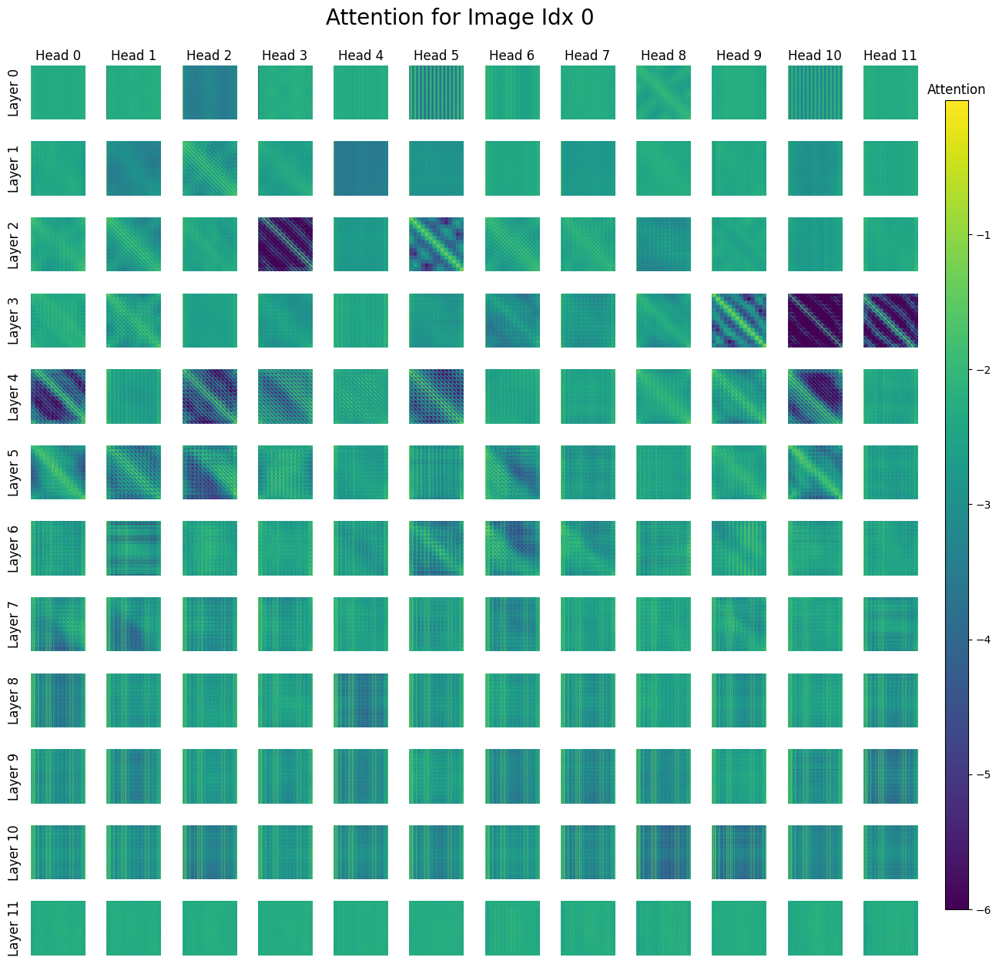

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00579697 0.00554778 0.0053719  0.00569401 0.00567228 0.00544803
 0.00544797 0.0055263  0.00552904 0.00569303]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00579697 0.00554778 0.0053719  0.00569401 0.00567228 0.00544803
 0.00544797 0.0055263  0.00552904 0.00569303]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Study corner head with CLS token
attn_head_idx_2 = 1
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_2, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1, attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns # Corner patterns with CLS token
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head: Attention Head {attn_head_idx_2}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (197, 197)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.53985506 0.00246276 0.00241707 0.00237194 0.00246484 0.00250864
 0.00249413 0.00252447 0.00254057 0.00250164]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Study corner head with CLS token
attn_head_idx_2 = 1
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_2, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1, attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns # Corner patterns with CLS token
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head with CLS Token: Attention Head {attn_head_idx_2}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (197, 197)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.53985506 0.00246276 0.00241707 0.00237194 0.00246484 0.00250864
 0.00249413 0.00252447 0.00254057 0.00250164]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Study attention patterns across all data  points
cfg = clip_model.cfg
attn_head_idx = 1
list_of_attn_heads = attn_head_idx
all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx)
all_patterns = all_patterns[0].squeeze(0).cpu().numpy()
print(f"All patterns shape:{all_patterns.shape}")
list_of_images = images[0]

print(f"Length of list of images: {len(list_of_images)}")
html_code_all = plot_javascript(
    [all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Corner head: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_all = "attention_visualisation_all.html"
try: 
    with open(output_path_all, 'w', encoding='utf-8') as f:
        f.write(html_code_all)
    abs_path = os.path.abspath(output_path_all)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

All patterns shape:(197, 197)
Length of list of images: 3
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[9.4742990e-01 2.9790701e-04 2.8333868e-04 2.6435315e-04 2.6687945e-04
 2.6451709e-04 2.7594206e-04 2.9039168e-04 2.8406296e-04 2.6044570e-04]
First 10 values of the first image data: tensor([0.8706, 0.8784, 0.8784, 0.8745, 0.8706, 0.8627, 0.8588, 0.8627, 0.8667,
        0.8627])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation_all.html

To view:
1. Find the file in your directory.
2. Double-click to open in your web browser.
3. Or copy this path and paste to your browser address bar: file://c:\Users\User\Documents\Cross_modal_interpretability\diagno

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 8  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00579697 0.00554778 0.0053719  0.00569401 0.00567228 0.00544803
 0.00544797 0.0055263  0.00552904 0.00569303]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00579697 0.00554778 0.0053719  0.00569401 0.00567228 0.00544803
 0.00544797 0.0055263  0.00552904 0.00569303]
First 10 values of the first image data: [0.87058824 0.8784314  0.8784314  0.8745098  0.87058824 0.8627451
 0.85882354 0.8627451  0.8666667  0.8627451 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.89s)
creating index...
index created!
Batch of images: tensor([[[[0.3725, 0.3882, 0.3647,  ..., 0.4902, 0.4863, 0.4941],
          [0.4000, 0.4392, 0.4157,  ..., 0.4902, 0.4824, 0.4863],
          [0.4314, 0.4627, 0.4549,  ..., 0.4824, 0.4784, 0.4863],
          ...,
          [0.3451, 0.4431, 0.4667,  ..., 0.6471, 0.6549, 0.6549],
          [0.3725, 0.4275, 0.4157,  ..., 0.6471, 0.6510, 0.6549],
          [0.4157, 0.4078, 0.3490,  ..., 0.6471, 0.6510, 0.6510]],

         [[0.4314, 0.4392, 0.4196,  ..., 0.6980, 0.6980, 0.7020],
          [0.4745, 0.5059, 0.4902,  ..., 0.6980, 0.6941, 0.6941],
          [0.5412, 0.5647, 0.5647,  ..., 0.7020, 0.6980, 0.6980],
          ...,
          [0.5333, 0.6275, 0.6471,  ..., 0.8510, 0.8510, 0.8510],
          [0.5451, 0.6000, 0.5804,  ..., 0.8510, 0.8510, 0.8510],
          [0.5686, 0.5686, 0.4980,  ..., 0.8510, 0.8549, 0.8549]],

         [[0.4863, 0.5176, 0.4902,  ..., 0.9961, 0.9922, 0.9961],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[19.7125, 23.5667, 21.7517, 23.4908, 22.5629, 22.7058, 22.3934, 17.0478],
        [19.5927, 23.2197, 21.6728, 23.4285, 22.3062, 22.3562, 22.3037, 16.8200],
        [19.7273, 23.2199, 21.7260, 23.3631, 22.3066, 22.4834, 22.4371, 16.9380],
        [19.3599, 23.3195, 21.6196, 23.1195, 22.1221, 22.6422, 22.5304, 16.8144],
        [19.9563, 23.6074, 21.9675, 23.5490, 22.3203, 22.7477, 22.5656, 16.9884],
        [19.7688, 23.6685, 21.8893, 23.3729, 22.2918, 22.7328, 22.4030, 16.9327],
        [19.6152, 23.4142, 21.6658, 23.3843, 22.3193, 22.6084, 22.4097, 16.9093],
        [19.8453, 23.2973, 21.7044, 23.5791, 22.3709, 22.3442, 22.1938, 16.9310]],
       device='cuda:0')
Text Logits: tensor([[19.7125, 19.5927, 19.7273, 19.3599, 19.9563, 19.7688, 19.6152, 19.8453],
        [23.5667, 23.2197, 23.2199, 23.3195, 23.6074, 23.6685, 23.4142, 23.2973],
        [21.7517, 21.6728, 21.7260, 21.6196, 21.9675, 21.8893, 21.6658, 21.7044],
        [23.4908, 23.4285, 23.3631, 23.1195, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.005671706050634384


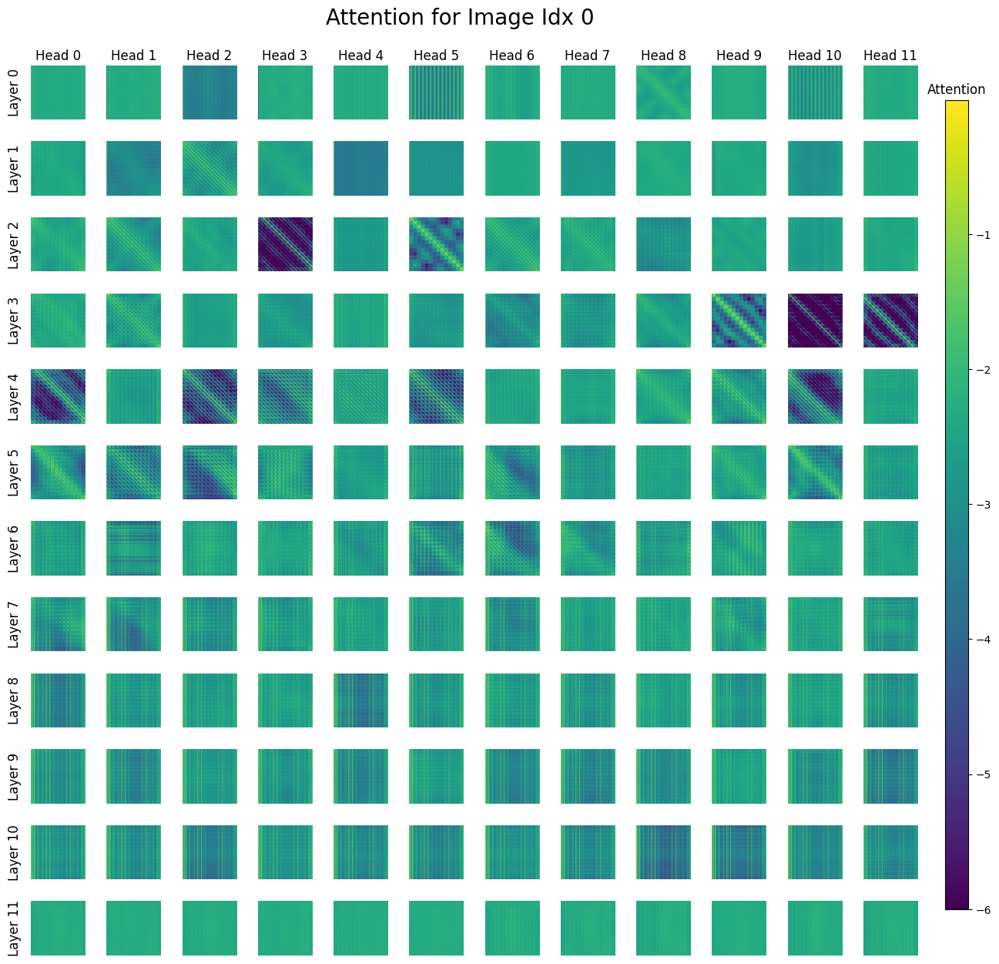

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00581762 0.00553194 0.0053469  0.00567834 0.00565479 0.00541464
 0.00544393 0.00551741 0.00550431 0.00569337]
First 10 values of the first image data: [0.37254903 0.3882353  0.3647059  0.3529412  0.3372549  0.34117648
 0.2784314  0.24705882 0.3254902  0.3764706 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your

In [ ]:
# Study corner head with CLS token
attn_head_idx_2 = 1
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_2, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1, attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns # Corner patterns with CLS token
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head with CLS Token: Attention Head {attn_head_idx_2}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (197, 197)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.539883   0.00246443 0.0024163  0.00237149 0.00246815 0.0025097
 0.00249586 0.00252961 0.00254639 0.0025042 ]
First 10 values of the first image data: [0.37254903 0.3882353  0.3647059  0.3529412  0.3372549  0.34117648
 0.2784314  0.24705882 0.3254902  0.3764706 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
# Study attention patterns across all data  points
cfg = clip_model.cfg
attn_head_idx = 1
list_of_attn_heads = attn_head_idx
all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx)
all_patterns = all_patterns[0].squeeze(0).cpu().numpy()
print(f"All patterns shape:{all_patterns.shape}")
list_of_images = images[0]

print(f"Length of list of images: {len(list_of_images)}")
html_code_all = plot_javascript(
    [all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Corner head: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_all = "attention_visualisation_all.html"
try: 
    with open(output_path_all, 'w', encoding='utf-8') as f:
        f.write(html_code_all)
    abs_path = os.path.abspath(output_path_all)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

All patterns shape:(197, 197)
Length of list of images: 3
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[9.4735706e-01 2.9704694e-04 2.8315079e-04 2.6201105e-04 2.6446625e-04
 2.6454366e-04 2.7395721e-04 2.9352104e-04 2.8758589e-04 2.6240840e-04]
First 10 values of the first image data: tensor([0.3725, 0.3882, 0.3647, 0.3529, 0.3373, 0.3412, 0.2784, 0.2471, 0.3255,
        0.3765])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation_all.html

To view:
1. Find the file in your directory.
2. Double-click to open in your web browser.
3. Or copy this path and paste to your browser address bar: file://c:\Users\User\Documents\Cross_modal_interpretability\diagno

In [ ]:
# Corner token indices
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
full_image_logits, full_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)
total_full_patterns = visualise_attention(attn_head_idx, image_cache,cfg, "Attention Scores", 700,attention_type="hook_pattern")
print(f"Full patterns shape: {total_full_patterns.shape}")
num_patch_side = 14
top_left = 1 # First patch (skip CLASS at 0)
top_right = num_patch_side # Last oatch in the first row
bottom_left = (num_patch_side - 1) * num_patch_side + 1 # First patch in the last row
bottom_right = num_patch_side * num_patch_side # Last patch in the last row

print(f"Corner token indices:")
print(f" Top-left: {top_left}")
print(f"Top-right: {top_right}")
print(f"Bottom-left:{bottom_left}")
print(f"Bottom-right:{bottom_right}")
corner_tokens = [top_left,top_right,bottom_left,bottom_right]
full_corner_patterns = full_patterns[corner_tokens,:]
print(f"Corner Patterns' shape: {corner_patterns.shape}")
if hasattr(full_corner_patterns,'cpu'):
    full_patterns_np = full_corner_patterns.cpu().numpy()
else: full_patterns_np = np.array(full_corner_patterns)
image_np: np.ndarray = images[batch_idx].cpu().numpy()
print(f"Corner pattern shape after extraction: {full_patterns_np.shape}")

patterns_list = []
for i in range(4):
    # Reshape to [1,197] then expand to [197, 197] by repeating
    # This shpws the attention pattern as a row we can visualise
    patterns_2d = patterns_np[i:i+1, :]
    # Repeat the pattern to make it visible in the attention matrix
    patterns_2d = einops.repeat(patterns_2d, 'r c -> r c repeat', repeat = 197)
    patterns_list.append(patterns_2d)
# Verify we have the expected shape for CLIP ViT
#expected_tokens = 197  # 196 patches + 1 CLS for CLIP ViT-B/32
#if corner_pattern.shape[0] != expected_tokens or corner_pattern.shape[1] != expected_tokens:
#    print(f"Warning: Expected {expected_tokens}x{expected_tokens} attention matrix, got {corner_pattern.shape}")

# Convert to numpy
#if hasattr(corner_pattern, 'cpu'):
#    patterns_np: np.ndarray = corner_pattern.cpu().numpy()
#elif hasattr(corner_pattern, 'numpy'):
#    patterns_np: np.ndarray = corner_pattern.numpy()
#else:
#    patterns_np: np.ndarray = np.array(corner_pattern)

print(f"Numpy array shape: {corner_patterns.shape}")
print(f"Attention value range: {corner_patterns.min():.4f} to {corner_patterns.max():.4f}")
print(f"Attention first value:{corner_patterns[0]}")
print(f"Minimum attention data: {np.min(corner_patterns)}")
print(f"Maximum attention data:{np.max(corner_patterns)}")
# Generate HTML visualization
html_code = plot_javascript(
        patterns_list,  # List containing the 2D attention matrix
        [image_np] * 4,
        cfg=cfg,  # Use the actual model config
        list_of_names=[
            f"Top-left Corner (Token {top_left})",
            f"Top-right Corner (Token {top_right})",
            f"Bottom-left Corner (Token {bottom_left})",
            f"Bottom-right Corner (Token{bottom_right})"
        ],
        ATTN_SCALING=2,
        cls_token=True  # This should match your 197x197 matrix
    )
# Save the HTML file
#output_path = 'attention_visualization.html'
#try:
#    with open(output_path, 'w', encoding='utf-8') as f:
#        f.write(html_code)
    
#    abs_path = os.path.abspath(output_path)
#    print(f"\n✅ HTML VISUALIZATION SAVED!")
#    print(f"📁 File: {abs_path}")
#    print(f"🌐 URL: file://{abs_path}")
#    print(f"\nTo view:")
#    print(f"1. Copy this path: {abs_path}")
#    print(f"2. Paste into your browser address bar")
#    print(f"3. Or double-click the file in file explorer")
    
#except Exception as e:
#    print(f"❌ Error saving HTML file: {e}")

# Optional: If you're in Jupyter notebook, you can also display inline
#try:
#    from IPython.display import HTML
#    print(f"\n📖 Displaying in notebook...")
#    HTML(html_code)  # This will show the visualization directly in Jupyter
#except ImportError:
#    print(f"\n💡 Not in Jupyter - open the saved HTML file to view visualization")

# Debug: save HTML to file to check JavaScript errors
#with open('debug_viz.html', 'w') as file:
#    file.write(html_code)
#print("HTML saved to debug_viz.html - open in browser to check for JavaScript errors")

Full patterns shape: torch.Size([1, 12, 197, 197])
Corner token indices:
 Top-left: 1
Top-right: 14
Bottom-left:183
Bottom-right:196
Corner Patterns' shape: torch.Size([197, 197])


NameError: name 'batch_idx' is not defined

In [ ]:
# Study corner head with CLS token
attn_head_idx_2 = 1
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_2, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1, attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns # Corner patterns with CLS token
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head with CLS Token: Attention Head {attn_head_idx_2}"],
        ATTN_SCALING=2  # This should match your 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (197, 197)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.539883   0.00246443 0.0024163  0.00237149 0.00246815 0.0025097
 0.00249586 0.00252961 0.00254639 0.0025042 ]
First 10 values of the first image data: [0.37254903 0.3882353  0.3647059  0.3529412  0.3372549  0.34117648
 0.2784314  0.24705882 0.3254902  0.3764706 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.72s)
creating index...
index created!
Batch of images: tensor([[[[0.8314, 0.7412, 0.4627,  ..., 0.3020, 0.3020, 0.2980],
          [0.8314, 0.7294, 0.5412,  ..., 0.3059, 0.3020, 0.2941],
          [0.7882, 0.7529, 0.6824,  ..., 0.3059, 0.2980, 0.2941],
          ...,
          [0.1412, 0.1451, 0.1451,  ..., 0.1137, 0.1020, 0.1059],
          [0.1451, 0.1451, 0.1451,  ..., 0.1098, 0.0980, 0.1098],
          [0.1451, 0.1412, 0.1451,  ..., 0.1216, 0.1137, 0.1098]],

         [[0.6824, 0.6314, 0.5098,  ..., 0.2784, 0.2745, 0.2588],
          [0.6627, 0.6588, 0.6392,  ..., 0.2745, 0.2745, 0.2667],
          [0.6314, 0.7608, 0.8157,  ..., 0.2745, 0.2667, 0.2667],
          ...,
          [0.1686, 0.1725, 0.1686,  ..., 0.1451, 0.1373, 0.1373],
          [0.1647, 0.1647, 0.1647,  ..., 0.1451, 0.1333, 0.1412],
          [0.1647, 0.1608, 0.1608,  ..., 0.1529, 0.1373, 0.1412]],

         [[0.4078, 0.4510, 0.5059,  ..., 0.1843, 0.1882, 0.1843],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[20.0388, 20.7493, 20.9629, 22.6870, 21.5808, 19.2568, 20.5081, 21.7973],
        [19.9040, 19.8953, 21.3265, 22.6562, 21.5793, 19.0224, 20.2831, 21.7556],
        [19.9885, 19.1819, 21.7103, 22.5114, 21.7153, 18.8291, 20.2395, 21.5862],
        [19.8880, 19.6622, 21.6007, 22.5730, 21.6545, 18.9816, 20.3124, 21.6507],
        [20.0178, 19.0894, 21.7247, 22.5154, 21.7512, 18.7742, 20.2685, 21.5503],
        [19.9826, 19.2552, 21.7610, 22.5017, 21.7017, 18.7658, 20.2165, 21.5871],
        [20.0369, 19.4746, 21.5063, 22.5353, 21.7600, 18.9509, 20.4596, 21.5648],
        [19.8969, 20.1704, 21.3868, 22.5996, 21.6628, 19.0557, 20.4707, 21.4664]],
       device='cuda:0')
Text Logits: tensor([[20.0388, 19.9040, 19.9885, 19.8880, 20.0178, 19.9826, 20.0369, 19.8969],
        [20.7493, 19.8953, 19.1819, 19.6622, 19.0894, 19.2552, 19.4746, 20.1704],
        [20.9629, 21.3265, 21.7103, 21.6007, 21.7247, 21.7610, 21.5063, 21.3868],
        [22.6870, 22.6562, 22.5114, 22.5730, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.0038823613431304693


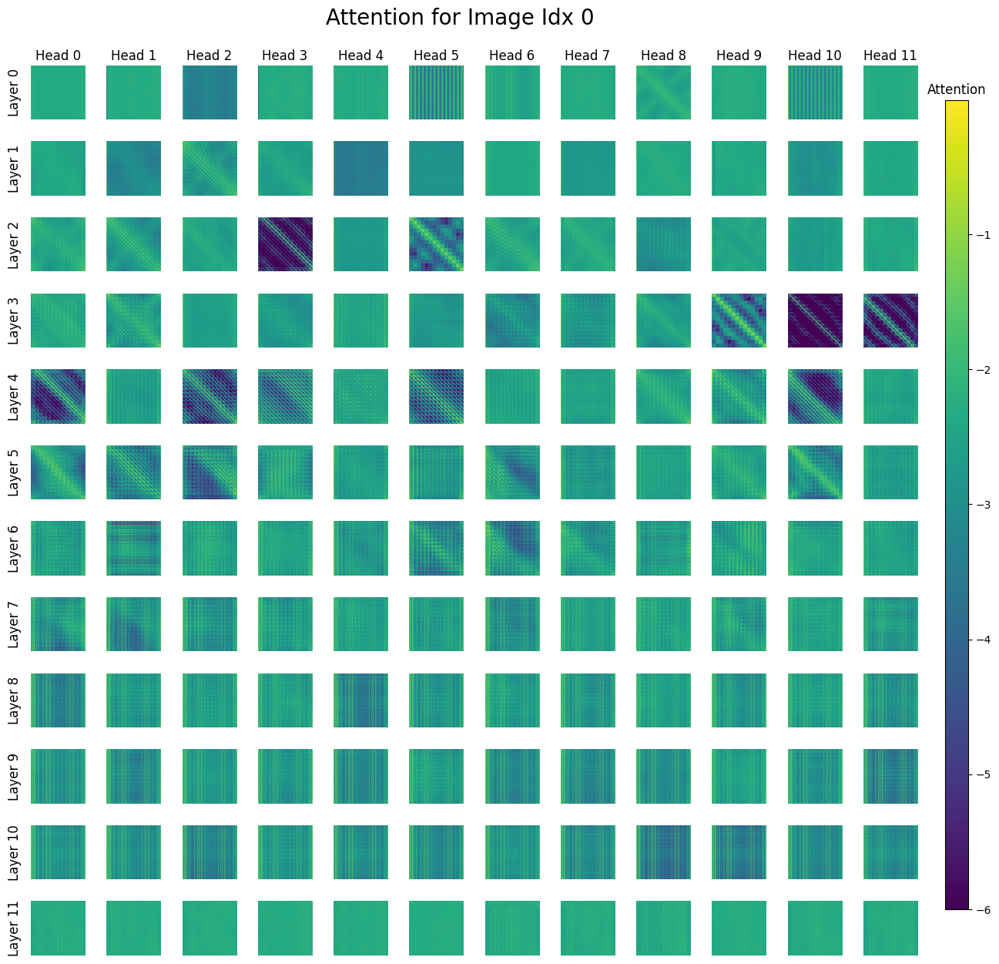

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.0058045  0.00555005 0.00537418 0.00569631 0.00567512 0.00544846
 0.00544978 0.00552786 0.00552733 0.00569449]
First 10 values of the first image data: [0.83137256 0.7411765  0.4627451  0.3882353  0.38431373 0.41568628
 0.50980395 0.7607843  0.92156863 0.9607843 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.69s)
creating index...
index created!
Batch of images: tensor([[[[0.4078, 0.7020, 0.5647,  ..., 0.0902, 0.0667, 0.0627],
          [0.3922, 0.6941, 0.3765,  ..., 0.1176, 0.0745, 0.0863],
          [0.4275, 0.6902, 0.4000,  ..., 0.1333, 0.0745, 0.0784],
          ...,
          [0.6118, 0.6078, 0.6196,  ..., 0.3647, 0.3686, 0.3686],
          [0.3608, 0.3922, 0.3569,  ..., 0.3490, 0.3647, 0.3725],
          [0.3216, 0.3373, 0.3373,  ..., 0.3490, 0.3529, 0.3569]],

         [[0.4039, 0.7020, 0.5647,  ..., 0.0980, 0.0745, 0.0667],
          [0.3882, 0.6902, 0.3686,  ..., 0.1255, 0.0824, 0.0941],
          [0.4275, 0.6941, 0.4000,  ..., 0.1373, 0.0784, 0.0863],
          ...,
          [0.5804, 0.5765, 0.5882,  ..., 0.4000, 0.4039, 0.4078],
          [0.3451, 0.3686, 0.3294,  ..., 0.3882, 0.4000, 0.4118],
          [0.3137, 0.3216, 0.3176,  ..., 0.3804, 0.3882, 0.3882]],

         [[0.4627, 0.7098, 0.5686,  ..., 0.0784, 0.0627, 0.0627],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[21.2039, 25.9201, 22.6743, 24.5465, 19.5161, 23.1354, 20.3793, 21.8778],
        [21.2911, 25.8157, 22.6712, 24.4716, 19.4557, 23.0947, 20.3187, 21.5868],
        [21.2934, 25.8836, 22.7064, 24.5683, 19.3827, 23.1503, 20.2880, 21.8373],
        [21.1316, 26.0486, 22.8493, 24.5520, 19.5395, 23.1470, 20.5591, 21.8522],
        [21.1437, 25.7302, 22.5878, 24.2847, 19.5682, 22.7928, 20.1589, 21.6355],
        [21.0780, 26.1630, 22.9197, 24.6231, 19.4399, 23.3450, 20.5555, 21.8604],
        [21.2297, 26.0682, 22.7324, 24.5875, 19.6780, 23.2437, 20.4165, 21.9081],
        [21.1217, 26.2212, 22.8720, 24.6672, 19.3574, 23.4045, 20.5397, 21.8868]],
       device='cuda:0')
Text Logits: tensor([[21.2039, 21.2911, 21.2934, 21.1316, 21.1437, 21.0780, 21.2297, 21.1217],
        [25.9201, 25.8157, 25.8836, 26.0486, 25.7302, 26.1630, 26.0682, 26.2212],
        [22.6743, 22.6712, 22.7064, 22.8493, 22.5878, 22.9197, 22.7324, 22.8720],
        [24.5465, 24.4716, 24.5683, 24.5520, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.005264183972030878


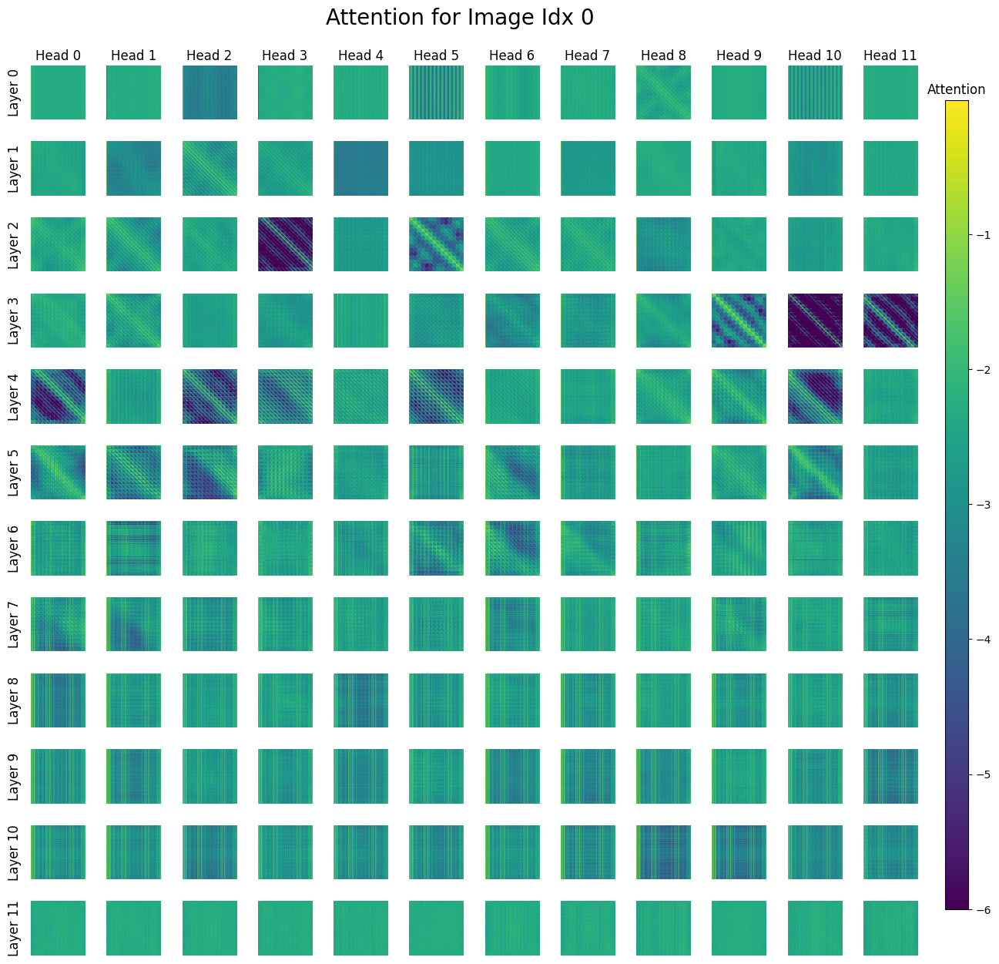

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00579488 0.00554705 0.00537247 0.00570937 0.00566307 0.00544088
 0.00544941 0.00552019 0.00552324 0.00569316]
First 10 values of the first image data: [0.40784314 0.7019608  0.5647059  0.47058824 0.44313726 0.67058825
 0.81960785 0.8509804  0.78431374 0.6784314 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.62s)
creating index...
index created!
Batch of images: tensor([[[[0.0863, 0.0824, 0.0824,  ..., 0.0588, 0.0588, 0.0627],
          [0.0863, 0.0902, 0.0902,  ..., 0.0588, 0.0627, 0.0627],
          [0.0902, 0.0941, 0.0941,  ..., 0.0627, 0.0627, 0.0627],
          ...,
          [0.6824, 0.6275, 0.6353,  ..., 0.3608, 0.4118, 0.4902],
          [0.7137, 0.7020, 0.7098,  ..., 0.3882, 0.4196, 0.4275],
          [0.7451, 0.7255, 0.7098,  ..., 0.4196, 0.4000, 0.3647]],

         [[0.2431, 0.2431, 0.2431,  ..., 0.1843, 0.1843, 0.1804],
          [0.2431, 0.2471, 0.2510,  ..., 0.1922, 0.1922, 0.1843],
          [0.2471, 0.2549, 0.2549,  ..., 0.1961, 0.1961, 0.1882],
          ...,
          [0.6784, 0.6353, 0.6392,  ..., 0.4039, 0.4471, 0.5137],
          [0.7098, 0.6980, 0.7098,  ..., 0.4353, 0.4588, 0.4667],
          [0.7412, 0.7216, 0.7098,  ..., 0.4588, 0.4471, 0.4078]],

         [[0.4353, 0.4431, 0.4431,  ..., 0.3686, 0.3490, 0.3373],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[24.2916, 22.1973, 21.3336, 25.2112, 18.2636, 19.7546, 19.5012, 21.1833],
        [24.3933, 22.2061, 21.4062, 24.8241, 18.1519, 19.7191, 19.6283, 21.1934],
        [24.3966, 22.2000, 21.3358, 24.9579, 18.1528, 19.6605, 19.6094, 21.1539],
        [24.1403, 22.1858, 21.4041, 24.9798, 18.2713, 19.6820, 19.0847, 21.0429],
        [24.3183, 22.1444, 21.3833, 24.9592, 18.2691, 19.6920, 19.2742, 21.0573],
        [24.3277, 22.4376, 21.5596, 24.7571, 18.6101, 20.2201, 19.6282, 21.3323],
        [23.3162, 21.8395, 20.8945, 25.2328, 17.8596, 19.4683, 18.5384, 20.7802],
        [24.4606, 22.1605, 21.3602, 24.8813, 18.1280, 19.7369, 19.5488, 21.1381]],
       device='cuda:0')
Text Logits: tensor([[24.2916, 24.3933, 24.3966, 24.1403, 24.3183, 24.3277, 23.3162, 24.4606],
        [22.1973, 22.2061, 22.2000, 22.1858, 22.1444, 22.4376, 21.8395, 22.1605],
        [21.3336, 21.4062, 21.3358, 21.4041, 21.3833, 21.5596, 20.8945, 21.3602],
        [25.2112, 24.8241, 24.9579, 24.9798, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.004074948839843273


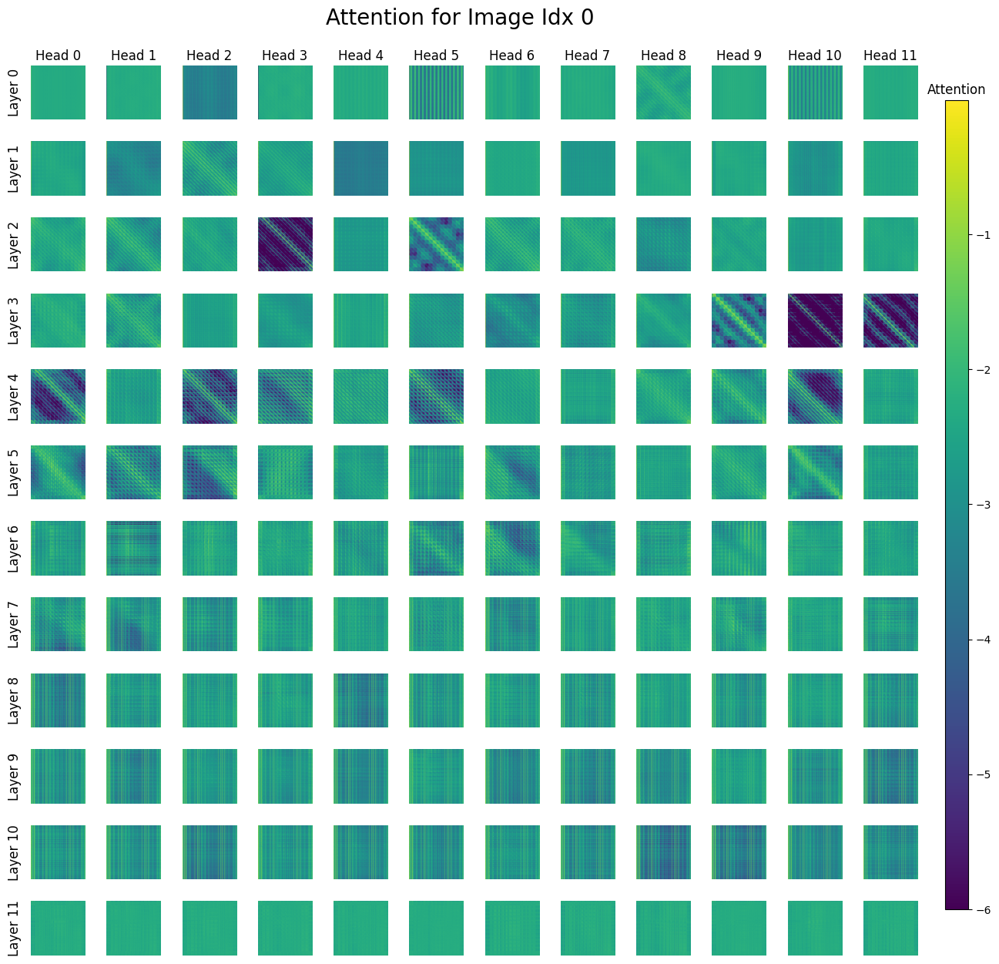

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00580109 0.00554365 0.00537291 0.00569989 0.00567596 0.0054502
 0.00545013 0.00552623 0.00552697 0.00568766]
First 10 values of the first image data: [0.08627451 0.08235294 0.08235294 0.08627451 0.09411765 0.09803922
 0.09019608 0.08627451 0.09019608 0.09411765]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.90s)
creating index...
index created!
Batch of images: tensor([[[[0.8078, 0.8039, 0.7961,  ..., 0.8196, 0.8157, 0.8157],
          [0.7608, 0.7686, 0.7647,  ..., 0.8196, 0.8157, 0.8118],
          [0.7647, 0.7725, 0.7725,  ..., 0.8275, 0.8235, 0.8196],
          ...,
          [0.5098, 0.5255, 0.5176,  ..., 0.5765, 0.5765, 0.5765],
          [0.5137, 0.5255, 0.5216,  ..., 0.5843, 0.5843, 0.5843],
          [0.5176, 0.5176, 0.5255,  ..., 0.5882, 0.5882, 0.5882]],

         [[0.8118, 0.8078, 0.8000,  ..., 0.8118, 0.8078, 0.8078],
          [0.7647, 0.7725, 0.7686,  ..., 0.8118, 0.8078, 0.8039],
          [0.7686, 0.7765, 0.7765,  ..., 0.8196, 0.8157, 0.8118],
          ...,
          [0.4392, 0.4588, 0.4549,  ..., 0.5059, 0.5098, 0.5098],
          [0.4471, 0.4588, 0.4588,  ..., 0.5176, 0.5176, 0.5176],
          [0.4510, 0.4510, 0.4588,  ..., 0.5176, 0.5176, 0.5137]],

         [[0.7922, 0.7882, 0.7804,  ..., 0.8157, 0.8118, 0.8118],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[22.3636, 20.0297, 20.9928, 21.7311, 20.0312, 21.3746, 18.1727, 22.5669],
        [22.2655, 20.0781, 21.0661, 21.8001, 20.1986, 21.2276, 18.2520, 22.5252],
        [22.2762, 19.7694, 21.1690, 21.8621, 20.4295, 21.3072, 18.3542, 22.6951],
        [22.0915, 19.9645, 21.2445, 21.7243, 20.3058, 21.2077, 18.2745, 22.6149],
        [22.3862, 19.9742, 21.0261, 21.7672, 20.0393, 21.3887, 18.2617, 22.5613],
        [22.1444, 20.1382, 21.1836, 21.4863, 20.3088, 21.0477, 18.2569, 22.5885],
        [22.0837, 20.0299, 20.8803, 21.7162, 20.2271, 21.1959, 18.1272, 22.5626],
        [22.2386, 20.0288, 21.1496, 21.8165, 20.4713, 21.2521, 18.3149, 22.6952]],
       device='cuda:0')
Text Logits: tensor([[22.3636, 22.2655, 22.2762, 22.0915, 22.3862, 22.1444, 22.0837, 22.2386],
        [20.0297, 20.0781, 19.7694, 19.9645, 19.9742, 20.1382, 20.0299, 20.0288],
        [20.9928, 21.0661, 21.1690, 21.2445, 21.0261, 21.1836, 20.8803, 21.1496],
        [21.7311, 21.8001, 21.8621, 21.7243, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.0036904856096953154


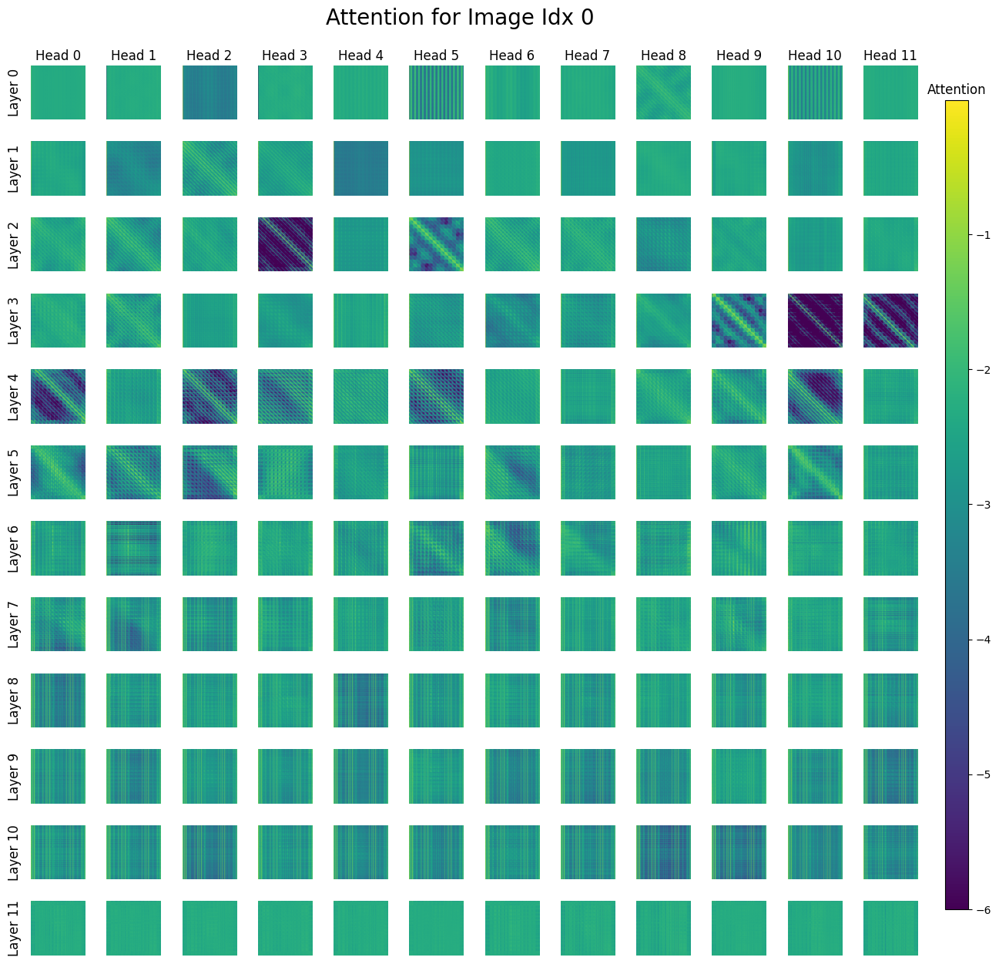

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00582345 0.00554652 0.00536618 0.00569037 0.00566669 0.00543889
 0.00544166 0.00552261 0.00552378 0.00568549]
First 10 values of the first image data: [0.80784315 0.8039216  0.79607844 0.7882353  0.78431374 0.7764706
 0.7647059  0.75686276 0.7490196  0.7490196 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.64s)
creating index...
index created!
Batch of images: tensor([[[[0.7412, 0.7686, 0.7569,  ..., 0.8980, 0.7529, 0.6980],
          [0.6941, 0.7529, 0.7725,  ..., 0.8667, 0.8902, 0.8275],
          [0.5882, 0.6824, 0.7255,  ..., 0.7765, 0.7765, 0.5922],
          ...,
          [0.5020, 0.4824, 0.4706,  ..., 0.5373, 0.5176, 0.4118],
          [0.4627, 0.4627, 0.4863,  ..., 0.5098, 0.5412, 0.5216],
          [0.4745, 0.4667, 0.4706,  ..., 0.5490, 0.5412, 0.5098]],

         [[0.7412, 0.7725, 0.7608,  ..., 0.9020, 0.8275, 0.7725],
          [0.6941, 0.7529, 0.7725,  ..., 0.8667, 0.9020, 0.8863],
          [0.5843, 0.6824, 0.7255,  ..., 0.8039, 0.8588, 0.7255],
          ...,
          [0.6235, 0.6157, 0.6157,  ..., 0.5882, 0.5490, 0.4039],
          [0.5882, 0.5961, 0.6078,  ..., 0.5255, 0.5529, 0.5255],
          [0.5765, 0.5882, 0.6118,  ..., 0.5137, 0.5451, 0.5216]],

         [[0.7373, 0.7804, 0.7725,  ..., 0.9059, 0.8549, 0.8235],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[22.8708, 21.3774, 22.3634, 18.4302, 23.1978, 23.5527, 20.9658, 21.7771],
        [22.7558, 21.0675, 21.8860, 18.6717, 22.9829, 23.0838, 20.8194, 21.8884],
        [22.9434, 21.3820, 22.4080, 18.4615, 23.2304, 23.5438, 21.0163, 21.7533],
        [22.8846, 21.3527, 22.2956, 18.4075, 23.1501, 23.4389, 20.9362, 21.9048],
        [22.8763, 21.4127, 22.3482, 18.4633, 23.2067, 23.4647, 21.0555, 21.7641],
        [22.9060, 21.1794, 22.0942, 18.5584, 23.1577, 23.3248, 20.9376, 21.8886],
        [22.9075, 21.3588, 22.4067, 18.4133, 23.2037, 23.5024, 20.9809, 21.7646],
        [22.6828, 21.0879, 21.8687, 18.5847, 22.9171, 23.1094, 20.8441, 21.7248]],
       device='cuda:0')
Text Logits: tensor([[22.8708, 22.7558, 22.9434, 22.8846, 22.8763, 22.9060, 22.9075, 22.6828],
        [21.3774, 21.0675, 21.3820, 21.3527, 21.4127, 21.1794, 21.3588, 21.0879],
        [22.3634, 21.8860, 22.4080, 22.2956, 22.3482, 22.0942, 22.4067, 21.8687],
        [18.4302, 18.6717, 18.4615, 18.4075, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.003712389850988984


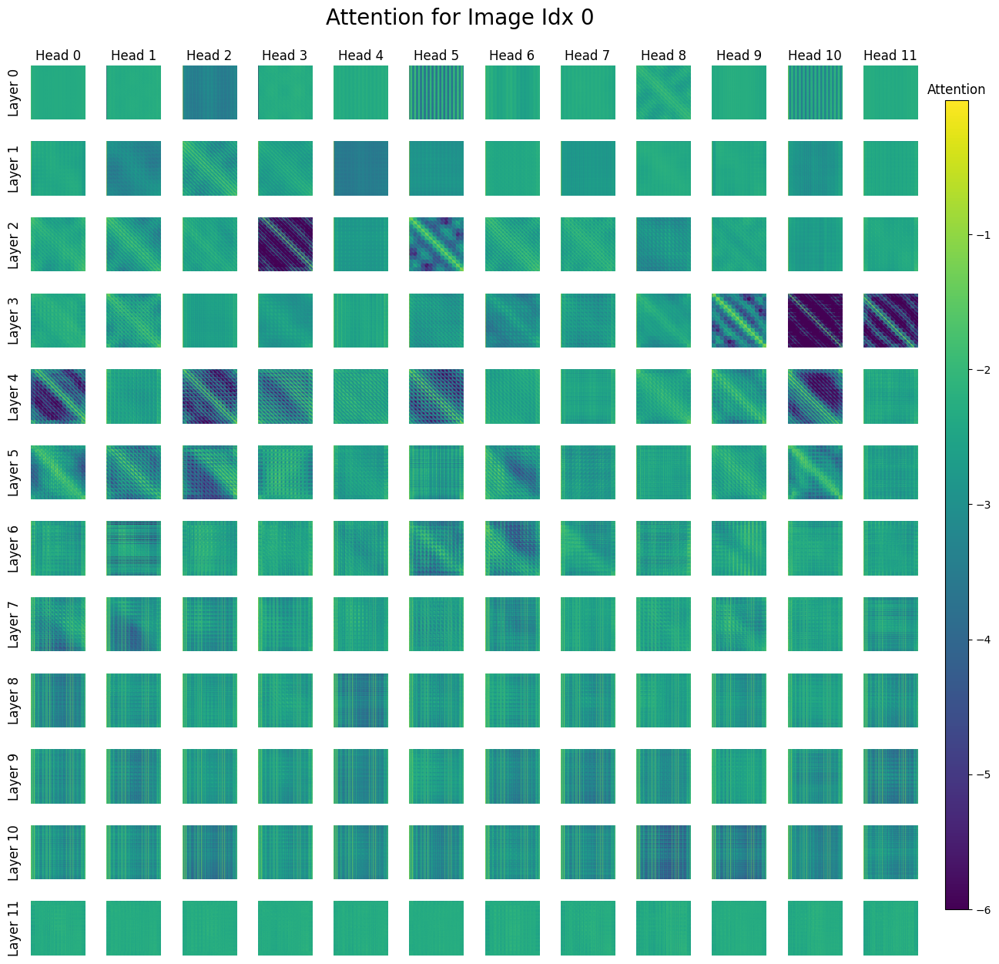

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00581315 0.00555498 0.00537336 0.00569797 0.00563498 0.00542166
 0.00542727 0.00553094 0.00552773 0.00569338]
First 10 values of the first image data: [0.7411765  0.76862746 0.75686276 0.7176471  0.69411767 0.7058824
 0.69803923 0.6784314  0.65882355 0.61960787]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.67s)
creating index...
index created!
Batch of images: tensor([[[[0.2196, 0.2431, 0.3137,  ..., 0.1608, 0.1608, 0.1176],
          [0.2314, 0.2431, 0.3059,  ..., 0.1608, 0.1725, 0.1176],
          [0.2471, 0.2667, 0.3137,  ..., 0.2039, 0.1843, 0.1294],
          ...,
          [0.5412, 0.5490, 0.5569,  ..., 0.5255, 0.5176, 0.5059],
          [0.5294, 0.5412, 0.5529,  ..., 0.5216, 0.5098, 0.5020],
          [0.5216, 0.5373, 0.5451,  ..., 0.5137, 0.5020, 0.4941]],

         [[0.2902, 0.3059, 0.3333,  ..., 0.3255, 0.3333, 0.3255],
          [0.2941, 0.3098, 0.3373,  ..., 0.3020, 0.3451, 0.3294],
          [0.2980, 0.3294, 0.3490,  ..., 0.3176, 0.3569, 0.3373],
          ...,
          [0.5922, 0.5882, 0.5922,  ..., 0.5255, 0.5176, 0.5059],
          [0.5843, 0.5882, 0.5843,  ..., 0.5255, 0.5137, 0.5059],
          [0.5765, 0.5804, 0.5765,  ..., 0.5216, 0.5098, 0.5020]],

         [[0.3176, 0.3373, 0.3569,  ..., 0.1098, 0.0941, 0.0627],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[20.2425, 21.0768, 22.2708, 22.3358, 22.5383, 21.0126, 23.8892, 25.1103],
        [20.0982, 21.0575, 22.1762, 22.2641, 22.4893, 20.8199, 23.9345, 24.7949],
        [20.1191, 20.8790, 22.1346, 22.1795, 22.3771, 20.8894, 23.8914, 24.6754],
        [20.3077, 21.1832, 22.3001, 22.4910, 22.6523, 21.2160, 23.9281, 25.3555],
        [20.2751, 21.1506, 22.3351, 22.3939, 22.5961, 21.1097, 23.9692, 25.1980],
        [19.9868, 20.7688, 22.2329, 22.0450, 22.5454, 20.8955, 23.9622, 24.6126],
        [20.3369, 20.9976, 22.2673, 22.3831, 22.5371, 21.0888, 23.9476, 25.0625],
        [20.2784, 21.1366, 22.3219, 22.3192, 22.4733, 21.0691, 24.0004, 25.0896]],
       device='cuda:0')
Text Logits: tensor([[20.2425, 20.0982, 20.1191, 20.3077, 20.2751, 19.9868, 20.3369, 20.2784],
        [21.0768, 21.0575, 20.8790, 21.1832, 21.1506, 20.7688, 20.9976, 21.1366],
        [22.2708, 22.1762, 22.1346, 22.3001, 22.3351, 22.2329, 22.2673, 22.3219],
        [22.3358, 22.2641, 22.1795, 22.4910, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.003937370143830776


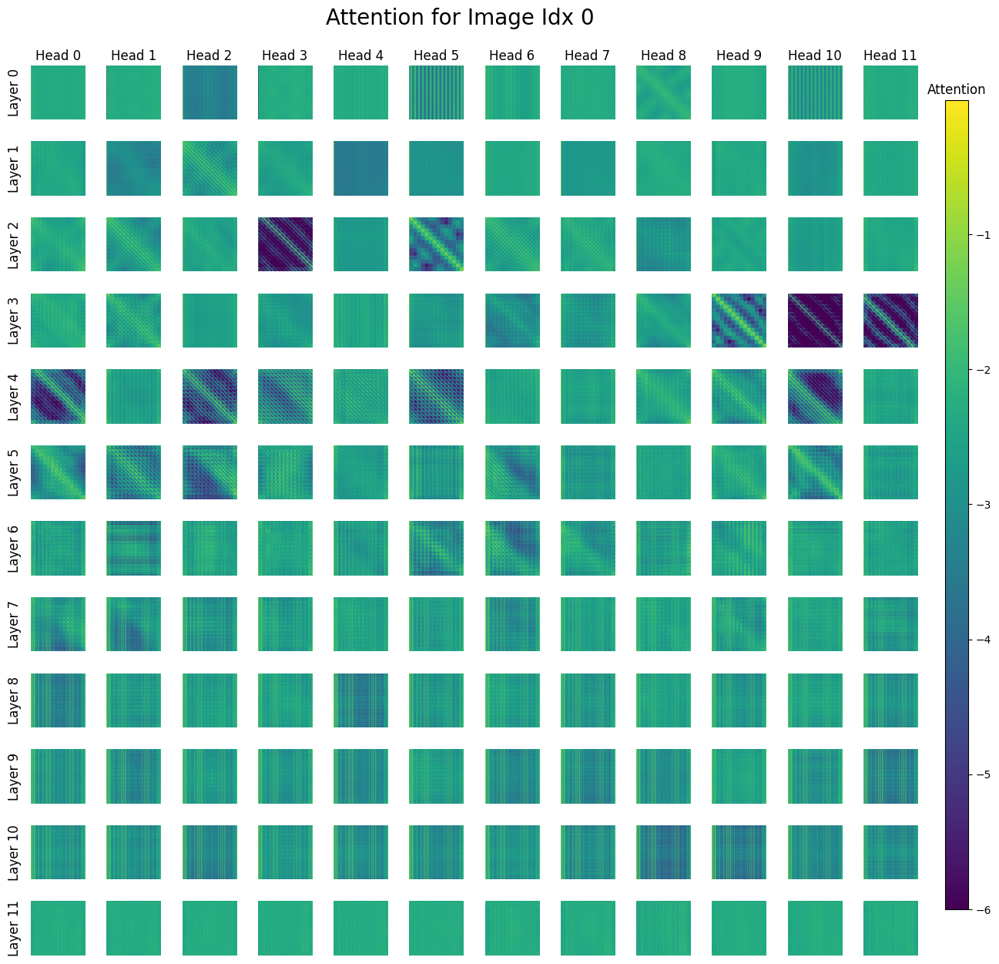

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

attn_head_idx_1 = 1
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
full_patterns = full_patterns[0][0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.0058041  0.00554635 0.00535687 0.00569387 0.00568123 0.00546279
 0.00547052 0.00554707 0.00552878 0.0056919 ]
First 10 values of the first image data: [0.21960784 0.24313726 0.3137255  0.4862745  0.53333336 0.5803922
 0.6117647  0.627451   0.63529414 0.6313726 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attention_visualisation.html

To view:
1. Find the file in your 

Restarted cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.68s)
creating index...
index created!
Batch of images: tensor([[[[0.4627, 0.4706, 0.4784,  ..., 0.7412, 0.7412, 0.7412],
          [0.4824, 0.4902, 0.5059,  ..., 0.6471, 0.6588, 0.6510],
          [0.4980, 0.4980, 0.5176,  ..., 0.8471, 0.8510, 0.8353],
          ...,
          [0.2706, 0.2549, 0.2157,  ..., 0.2627, 0.2431, 0.2314],
          [0.2314, 0.2235, 0.2118,  ..., 0.2431, 0.2431, 0.2431],
          [0.2235, 0.2353, 0.2196,  ..., 0.2627, 0.2784, 0.2745]],

         [[0.4706, 0.4863, 0.4941,  ..., 0.6314, 0.6275, 0.6157],
          [0.5176, 0.5255, 0.5333,  ..., 0.4745, 0.4784, 0.4706],
          [0.5490, 0.5490, 0.5529,  ..., 0.6627, 0.6745, 0.6627],
          ...,
          [0.2941, 0.2706, 0.2353,  ..., 0.2941, 0.2863, 0.2941],
          [0.2549, 0.2431, 0.2314,  ..., 0.3059, 0.2980, 0.2980],
          [0.2431, 0.2471, 0.2314,  ..., 0.3373, 0.3451, 0.3373]],

         [[0.5176, 0.5373, 0.5294,  ..., 0.4510, 0.4431, 0.4314],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[16.9982, 24.0965, 17.4687, 23.5088, 23.6645, 22.1100, 23.5016, 18.2855],
        [17.0326, 24.2915, 17.4447, 23.6896, 23.6328, 21.9299, 23.4449, 18.5809],
        [16.8438, 24.1614, 17.5124, 23.6564, 23.6791, 22.0226, 23.5029, 18.3904],
        [17.1099, 24.2782, 17.4078, 23.6049, 23.4292, 21.9787, 23.2188, 18.6429],
        [16.7038, 24.0006, 17.6061, 23.3844, 23.3279, 21.8917, 23.3213, 18.5768],
        [16.9110, 24.2005, 17.5119, 23.5056, 23.5776, 22.0090, 23.4170, 18.5573],
        [16.9689, 24.1970, 17.4858, 23.5051, 23.3598, 21.8800, 23.0315, 18.8018],
        [17.0228, 24.1215, 17.3096, 23.5256, 23.4222, 22.0130, 23.3101, 18.6433]],
       device='cuda:0')
Text Logits: tensor([[16.9982, 17.0326, 16.8438, 17.1099, 16.7038, 16.9110, 16.9689, 17.0228],
        [24.0965, 24.2915, 24.1614, 24.2782, 24.0006, 24.2005, 24.1970, 24.1215],
        [17.4687, 17.4447, 17.5124, 17.4078, 17.6061, 17.5119, 17.4858, 17.3096],
        [23.5088, 23.6896, 23.6564, 23.6049, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.005021519958972931


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.88s)
creating index...
index created!
Batch of images: tensor([[[[0.6510, 0.6549, 0.6510,  ..., 0.6510, 0.6471, 0.6471],
          [0.6510, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
          [0.6510, 0.6510, 0.6471,  ..., 0.6510, 0.6510, 0.6510],
          ...,
          [0.8745, 0.8627, 0.8588,  ..., 0.8980, 0.8863, 0.8745],
          [0.8745, 0.8745, 0.8745,  ..., 0.8863, 0.8902, 0.8824],
          [0.8784, 0.8784, 0.8902,  ..., 0.8863, 0.8902, 0.8941]],

         [[0.7333, 0.7373, 0.7333,  ..., 0.7412, 0.7373, 0.7373],
          [0.7333, 0.7333, 0.7333,  ..., 0.7412, 0.7412, 0.7412],
          [0.7333, 0.7333, 0.7294,  ..., 0.7412, 0.7412, 0.7412],
          ...,
          [0.7020, 0.7020, 0.6980,  ..., 0.7529, 0.7451, 0.7333],
          [0.7059, 0.7137, 0.7137,  ..., 0.7412, 0.7490, 0.7412],
          [0.7059, 0.7176, 0.7294,  ..., 0.7412, 0.7412, 0.7451]],

         [[0.8078, 0.8118, 0.8039,  ..., 0.8118, 0.8078, 0.8078],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[22.1693, 19.0254, 24.2842, 19.1620, 20.4767, 20.0035, 20.5333, 22.1139],
        [22.1552, 18.9607, 24.2641, 19.0670, 20.4531, 19.9278, 20.5232, 22.0885],
        [22.1817, 19.1464, 24.4473, 19.4043, 20.4904, 20.5125, 20.8257, 21.9538],
        [22.0911, 18.9064, 24.3684, 19.2622, 20.3898, 20.3906, 20.7427, 21.9226],
        [22.2021, 19.0952, 24.2730, 18.9933, 20.5053, 19.7409, 20.3383, 22.1701],
        [22.1617, 19.0357, 24.3780, 19.1955, 20.4727, 20.2101, 20.6167, 22.0548],
        [22.0269, 18.7695, 24.4394, 19.1159, 20.5249, 20.1509, 20.8089, 21.9049],
        [21.9261, 18.7805, 24.3588, 19.2558, 20.3833, 20.1271, 20.7364, 22.0321]],
       device='cuda:0')
Text Logits: tensor([[22.1693, 22.1552, 22.1817, 22.0911, 22.2021, 22.1617, 22.0269, 21.9261],
        [19.0254, 18.9607, 19.1464, 18.9064, 19.0952, 19.0357, 18.7695, 18.7805],
        [24.2842, 24.2641, 24.4473, 24.3684, 24.2730, 24.3780, 24.4394, 24.3588],
        [19.1620, 19.0670, 19.4043, 19.2622, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.002910929499194026


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.80s)
creating index...
index created!
Batch of images: tensor([[[[0.9922, 0.9882, 0.9922,  ..., 0.4431, 0.4353, 0.3922],
          [0.9922, 0.9922, 0.9922,  ..., 0.4431, 0.4235, 0.4118],
          [0.9882, 0.9922, 0.9961,  ..., 0.4235, 0.4118, 0.4078],
          ...,
          [0.3569, 0.3098, 0.2627,  ..., 0.4196, 0.4235, 0.4275],
          [0.3608, 0.2980, 0.2588,  ..., 0.4196, 0.4078, 0.4196],
          [0.3608, 0.2863, 0.2510,  ..., 0.4157, 0.3961, 0.4039]],

         [[0.9843, 0.9373, 0.9373,  ..., 0.4118, 0.3608, 0.2902],
          [0.9843, 0.9490, 0.9451,  ..., 0.4000, 0.3882, 0.3686],
          [0.9961, 0.9686, 0.9647,  ..., 0.3882, 0.3765, 0.3686],
          ...,
          [0.3294, 0.3059, 0.2588,  ..., 0.4784, 0.4824, 0.4824],
          [0.3333, 0.3098, 0.2745,  ..., 0.4824, 0.4784, 0.4863],
          [0.3373, 0.3059, 0.2745,  ..., 0.4784, 0.4824, 0.4745]],

         [[0.9294, 0.8000, 0.7922,  ..., 0.3843, 0.3216, 0.2392],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[22.2519, 19.3010, 17.4416, 21.9184, 26.1917, 19.1155, 18.5380, 22.0024],
        [22.2603, 19.4499, 17.2793, 21.9515, 26.2310, 19.2863, 18.5138, 22.1596],
        [21.7438, 18.7362, 17.3390, 21.5490, 25.1243, 18.7126, 17.8703, 21.5517],
        [22.1146, 19.1289, 17.3433, 21.8489, 25.8853, 18.9230, 18.2334, 21.9352],
        [22.2406, 19.1045, 17.3106, 21.9518, 25.9801, 18.9824, 18.3256, 22.1499],
        [22.2579, 19.0613, 17.6882, 21.6658, 25.9392, 19.1086, 18.6509, 21.8403],
        [22.2364, 19.3540, 17.1800, 21.7230, 26.2547, 19.0595, 18.5990, 22.0547],
        [22.2019, 19.4111, 17.1646, 21.8350, 26.2713, 19.0518, 18.5057, 22.2014]],
       device='cuda:0')
Text Logits: tensor([[22.2519, 22.2603, 21.7438, 22.1146, 22.2406, 22.2579, 22.2364, 22.2019],
        [19.3010, 19.4499, 18.7362, 19.1289, 19.1045, 19.0613, 19.3540, 19.4111],
        [17.4416, 17.2793, 17.3390, 17.3433, 17.3106, 17.6882, 17.1800, 17.1646],
        [21.9184, 21.9515, 21.5490, 21.8489, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.004311437718570232


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
# Study attention patterns across all data points
cfg = clip_model.cfg
attn_head_idx = 1
list_of_attn_heads = attn_head_idx
all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx)
all_patterns = all_patterns[0].squeeze(0).cpu().numpy()
print(f"All patterns shape:{all_patterns.shape}")
list_of_images = images[0]

print(f"Length of list of images: {len(list_of_images)}")
html_code_all = plot_javascript(
    [all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"Corner head across all data points: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_all = "attention_visualisation_all.html"
try: 
    with open(output_path_all, 'w', encoding='utf-8') as f:
        f.write(html_code_all)
    abs_path = os.path.abspath(output_path_all)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

NameError: name 'clip_model' is not defined

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.66s)
creating index...
index created!
Batch of images: tensor([[[[0.2078, 0.2078, 0.2000,  ..., 0.4196, 0.4902, 0.5176],
          [0.2039, 0.2157, 0.2157,  ..., 0.5216, 0.5137, 0.5020],
          [0.1882, 0.2039, 0.2157,  ..., 0.5176, 0.4941, 0.4627],
          ...,
          [0.4784, 0.4824, 0.4863,  ..., 0.0510, 0.0549, 0.0588],
          [0.4902, 0.4941, 0.5020,  ..., 0.0510, 0.0549, 0.0588],
          [0.5020, 0.4980, 0.4980,  ..., 0.0510, 0.0549, 0.0549]],

         [[0.1882, 0.1922, 0.1882,  ..., 0.4196, 0.5098, 0.5529],
          [0.1882, 0.2039, 0.2039,  ..., 0.5373, 0.5373, 0.5373],
          [0.1725, 0.1922, 0.2039,  ..., 0.5529, 0.5294, 0.5020],
          ...,
          [0.4431, 0.4510, 0.4549,  ..., 0.0353, 0.0392, 0.0431],
          [0.4431, 0.4510, 0.4627,  ..., 0.0392, 0.0431, 0.0431],
          [0.4431, 0.4471, 0.4549,  ..., 0.0431, 0.0431, 0.0431]],

         [[0.1725, 0.1765, 0.1725,  ..., 0.3961, 0.4980, 0.5529],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[21.9296, 18.9197, 24.0966, 21.4469, 21.6975, 22.7754, 24.1040, 22.4363],
        [21.7848, 18.6951, 23.6837, 21.1454, 21.2737, 22.4212, 24.1332, 22.4927],
        [22.0694, 19.0136, 24.1924, 21.4339, 21.8089, 22.6300, 24.1034, 22.4071],
        [21.9790, 18.9763, 24.1709, 21.4534, 21.8830, 22.7280, 23.9335, 22.3423],
        [21.9229, 18.9387, 24.0237, 21.3911, 22.0883, 22.5702, 23.7125, 22.2621],
        [22.0335, 18.8729, 24.0368, 21.5111, 21.8023, 22.6508, 24.1810, 22.4374],
        [22.1280, 18.9490, 24.0725, 21.4753, 21.8199, 22.4703, 24.1454, 22.4474],
        [21.8746, 18.7844, 24.0278, 21.2989, 21.6869, 22.6249, 23.7506, 22.2700]],
       device='cuda:0')
Text Logits: tensor([[21.9296, 21.7848, 22.0694, 21.9790, 21.9229, 22.0335, 22.1280, 21.8746],
        [18.9197, 18.6951, 19.0136, 18.9763, 18.9387, 18.8729, 18.9490, 18.7844],
        [24.0966, 23.6837, 24.1924, 24.1709, 24.0237, 24.0368, 24.0725, 24.0278],
        [21.4469, 21.1454, 21.4339, 21.4534, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.0048757875338196754


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.80s)
creating index...
index created!
Batch of images: tensor([[[[0.4431, 0.4510, 0.4627,  ..., 0.4980, 0.4980, 0.4980],
          [0.4471, 0.4549, 0.4627,  ..., 0.4980, 0.4980, 0.4980],
          [0.4549, 0.4627, 0.4706,  ..., 0.5059, 0.5059, 0.5059],
          ...,
          [0.6824, 0.6784, 0.5176,  ..., 0.5412, 0.4235, 0.4510],
          [0.6745, 0.5882, 0.5451,  ..., 0.5294, 0.5333, 0.5333],
          [0.5294, 0.3843, 0.4980,  ..., 0.7373, 0.8745, 0.8510]],

         [[0.6902, 0.6863, 0.6784,  ..., 0.7098, 0.7098, 0.7098],
          [0.6902, 0.6824, 0.6784,  ..., 0.7098, 0.7098, 0.7098],
          [0.6941, 0.6902, 0.6863,  ..., 0.7176, 0.7176, 0.7176],
          ...,
          [0.5843, 0.5804, 0.4275,  ..., 0.4588, 0.3686, 0.4118],
          [0.5765, 0.4902, 0.4510,  ..., 0.4627, 0.4980, 0.5137],
          [0.4314, 0.2824, 0.4000,  ..., 0.6745, 0.8471, 0.8392]],

         [[0.9686, 0.9686, 0.9686,  ..., 0.9922, 0.9922, 0.9922],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[19.5137, 19.9236, 21.2800, 22.8544, 20.8747, 19.6209, 24.3962, 21.7836],
        [19.0972, 19.8417, 21.8839, 24.0130, 21.3813, 19.8496, 24.2487, 22.3952],
        [19.4276, 19.8974, 21.3898, 23.5754, 21.6954, 19.7683, 24.5537, 21.8933],
        [19.2772, 19.7651, 21.6717, 23.6105, 21.4825, 19.6497, 24.4024, 21.9290],
        [19.4580, 20.0182, 21.6757, 23.5517, 21.5428, 19.8349, 24.6214, 22.0918],
        [19.6636, 19.8515, 21.4675, 23.5986, 21.7399, 19.5973, 24.8717, 21.9386],
        [19.1833, 19.9943, 21.6957, 23.8812, 21.6097, 19.8999, 24.3046, 22.0652],
        [19.4515, 19.9107, 21.8205, 23.7621, 21.4347, 19.6952, 24.4955, 22.2355]],
       device='cuda:0')
Text Logits: tensor([[19.5137, 19.0972, 19.4276, 19.2772, 19.4580, 19.6636, 19.1833, 19.4515],
        [19.9236, 19.8417, 19.8974, 19.7651, 20.0182, 19.8515, 19.9943, 19.9107],
        [21.2800, 21.8839, 21.3898, 21.6717, 21.6757, 21.4675, 21.6957, 21.8205],
        [22.8544, 24.0130, 23.5754, 23.6105, 2

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (HookedViTConfig): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.003929507452994585


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
print(f"CLIP model config: {clip_model.cfg}")

NameError: name 'clip_model' is not defined

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
print(f"CLIP model config: {clip_model.cfg}")

NameError: name 'clip_model' is not defined

In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
def plot_patched_component(patched_head, title=''):
  """
  Use for plotting Activation Patching.
  """

  fig = go.Figure(data=go.Heatmap(
      z=patched_head.detach().numpy(),
      colorscale='RdBu',  # You can choose any colorscale
      colorbar=dict(title='Value'),  # Customize the color bar
      hoverongaps=False
  ))
  fig.update_layout(
      title=title,
      xaxis_title='Attention Head',
      yaxis_title='Patch Number',
  )

  return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.87s)
creating index...
index created!
Batch of images: tensor([[[[0.8863, 0.8588, 0.8588,  ..., 0.3608, 0.3569, 0.3765],
          [0.8863, 0.8588, 0.8588,  ..., 0.4824, 0.4784, 0.4706],
          [0.8784, 0.8549, 0.8549,  ..., 0.4902, 0.5059, 0.4902],
          ...,
          [0.8431, 0.8353, 0.8392,  ..., 0.7765, 0.7843, 0.7765],
          [0.8235, 0.8314, 0.8078,  ..., 0.7804, 0.7765, 0.7686],
          [0.7922, 0.8039, 0.7882,  ..., 0.7686, 0.7647, 0.7569]],

         [[0.9647, 0.9529, 0.9569,  ..., 0.4314, 0.4392, 0.4353],
          [0.9608, 0.9529, 0.9569,  ..., 0.4980, 0.4941, 0.4941],
          [0.9608, 0.9529, 0.9529,  ..., 0.5255, 0.5294, 0.5216],
          ...,
          [0.8353, 0.8275, 0.8275,  ..., 0.7765, 0.7765, 0.7608],
          [0.8157, 0.8196, 0.7961,  ..., 0.7686, 0.7647, 0.7608],
          [0.7686, 0.7922, 0.7804,  ..., 0.7569, 0.7608, 0.7490]],

         [[0.9765, 0.9725, 0.9725,  ..., 0.5020, 0.5098, 0.4824],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[20.6749, 23.8499, 21.0850, 18.9627, 18.3442, 22.2319, 20.6076, 20.3607],
        [21.2321, 24.5915, 21.4616, 19.3766, 18.6733, 22.7575, 20.3685, 21.3118],
        [21.1225, 24.6237, 21.5589, 19.2507, 18.7270, 22.7322, 20.2310, 21.2368],
        [21.3224, 24.4122, 21.4386, 19.3259, 18.6571, 22.7436, 20.7896, 21.0118],
        [21.2761, 24.6214, 21.6489, 19.3386, 18.5428, 22.7942, 20.2080, 21.3495],
        [21.2278, 24.6315, 21.5125, 19.3185, 18.4295, 22.6800, 20.1349, 21.4682],
        [21.2515, 24.7053, 21.6461, 19.3798, 18.5131, 22.8006, 20.1109, 21.5456],
        [21.1947, 24.6373, 21.4750, 19.3726, 18.4334, 22.7495, 20.0453, 21.4376]],
       device='cuda:0')
Text Logits: tensor([[20.6749, 21.2321, 21.1225, 21.3224, 21.2761, 21.2278, 21.2515, 21.1947],
        [23.8499, 24.5915, 24.6237, 24.4122, 24.6214, 24.6315, 24.7053, 24.6373],
        [21.0850, 21.4616, 21.5589, 21.4386, 21.6489, 21.5125, 21.6461, 21.4750],
        [18.9627, 19.3766, 19.2507, 19.3259, 1

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

Image Logits: tensor([[20.6749, 23.8499, 21.0850, 18.9627, 18.3442, 22.2319, 20.6076, 20.3607],
        [21.2321, 24.5915, 21.4616, 19.3766, 18.6733, 22.7575, 20.3685, 21.3118],
        [21.1225, 24.6237, 21.5589, 19.2507, 18.7270, 22.7322, 20.2310, 21.2368],
        [21.3224, 24.4122, 21.4386, 19.3259, 18.6571, 22.7436, 20.7896, 21.0118],
        [21.2761, 24.6214, 21.6489, 19.3386, 18.5428, 22.7942, 20.2080, 21.3495],
        [21.2278, 24.6315, 21.5125, 19.3185, 18.4295, 22.6800, 20.1349, 21.4682],
        [21.2515, 24.7053, 21.6461, 19.3798, 18.5131, 22.8006, 20.1109, 21.5456],
        [21.1947, 24.6373, 21.4750, 19.3726, 18.4334, 22.7495, 20.0453, 21.4376]],
       device='cuda:0')
Text Logits: tensor([[20.6749, 21.2321, 21.1225, 21.3224, 21.2761, 21.2278, 21.2515, 21.1947],
        [23.8499, 24.5915, 24.6237, 24.4122, 24.6214, 24.6315, 24.7053, 24.6373],
        [21.0850, 21.4616, 21.5589, 21.4386, 21.6489, 21.5125, 21.6461, 21.4750],
        [18.9627, 19.3766, 19.2507, 19.3259, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (clip_model.cfg): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "attn_scores")
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        # Get the attention patterns for the head
        hook_name = f"blocks.{layer}.attn.hook_pattern"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type="attn_scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.0035089764278382063


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional, Dict
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.86s)
creating index...
index created!
Batch of images: tensor([[[[0.7451, 0.7451, 0.7529,  ..., 0.7451, 0.7373, 0.7294],
          [0.7529, 0.7490, 0.7451,  ..., 0.7412, 0.7333, 0.7294],
          [0.7529, 0.7490, 0.7451,  ..., 0.7451, 0.7412, 0.7412],
          ...,
          [0.3020, 0.2980, 0.3059,  ..., 0.3020, 0.3137, 0.3216],
          [0.3059, 0.3020, 0.3098,  ..., 0.2824, 0.2784, 0.2824],
          [0.3020, 0.2941, 0.2980,  ..., 0.2784, 0.2863, 0.2863]],

         [[0.7608, 0.7569, 0.7569,  ..., 0.7490, 0.7412, 0.7294],
          [0.7569, 0.7569, 0.7608,  ..., 0.7451, 0.7373, 0.7294],
          [0.7608, 0.7608, 0.7647,  ..., 0.7490, 0.7451, 0.7412],
          ...,
          [0.3333, 0.3216, 0.3176,  ..., 0.3765, 0.3725, 0.3765],
          [0.3373, 0.3294, 0.3294,  ..., 0.3333, 0.3373, 0.3451],
          [0.3490, 0.3412, 0.3451,  ..., 0.3373, 0.3294, 0.3216]],

         [[0.7725, 0.7725, 0.7725,  ..., 0.7686, 0.7608, 0.7490],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[21.1752, 23.7447, 18.0126, 23.3918, 15.1330, 19.9647, 19.8318, 20.6611],
        [21.0596, 23.8089, 18.2477, 23.1354, 15.3076, 19.7036, 20.2983, 20.2084],
        [20.7820, 23.3093, 18.2405, 23.1267, 15.4586, 20.0218, 20.2851, 20.7744],
        [21.1179, 23.7412, 18.0321, 23.3684, 15.1481, 19.9904, 19.8428, 20.7411],
        [20.6798, 23.4976, 18.4133, 23.1608, 15.6340, 19.9289, 20.5280, 20.7572],
        [20.9823, 23.5873, 18.4720, 23.3243, 15.5731, 20.0691, 20.3631, 21.0395],
        [21.0224, 23.7088, 18.1430, 23.2824, 15.1297, 19.8614, 20.0381, 20.6040],
        [21.0024, 23.6772, 18.1439, 23.3303, 15.2121, 19.9391, 20.0204, 20.6681]],
       device='cuda:0')
Text Logits: tensor([[21.1752, 21.0596, 20.7820, 21.1179, 20.6798, 20.9823, 21.0224, 21.0024],
        [23.7447, 23.8089, 23.3093, 23.7412, 23.4976, 23.5873, 23.7088, 23.6772],
        [18.0126, 18.2477, 18.2405, 18.0321, 18.4133, 18.4720, 18.1430, 18.1439],
        [23.3918, 23.1354, 23.1267, 23.3684, 2

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

Image Logits: tensor([[21.1752, 23.7447, 18.0126, 23.3918, 15.1330, 19.9647, 19.8318, 20.6611],
        [21.0596, 23.8089, 18.2477, 23.1354, 15.3076, 19.7036, 20.2983, 20.2084],
        [20.7820, 23.3093, 18.2405, 23.1267, 15.4586, 20.0218, 20.2851, 20.7744],
        [21.1179, 23.7412, 18.0321, 23.3684, 15.1481, 19.9904, 19.8428, 20.7411],
        [20.6798, 23.4976, 18.4133, 23.1608, 15.6340, 19.9289, 20.5280, 20.7572],
        [20.9823, 23.5873, 18.4720, 23.3243, 15.5731, 20.0691, 20.3631, 21.0395],
        [21.0224, 23.7088, 18.1430, 23.2824, 15.1297, 19.8614, 20.0381, 20.6040],
        [21.0024, 23.6772, 18.1439, 23.3303, 15.2121, 19.9391, 20.0204, 20.6681]],
       device='cuda:0')
Text Logits: tensor([[21.1752, 21.0596, 20.7820, 21.1179, 20.6798, 20.9823, 21.0224, 21.0024],
        [23.7447, 23.8089, 23.3093, 23.7412, 23.4976, 23.5873, 23.7088, 23.6772],
        [18.0126, 18.2477, 18.2405, 18.0321, 18.4133, 18.4720, 18.1430, 18.1439],
        [23.3918, 23.1354, 23.1267, 23.3684, 2

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional, Dict
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.64s)
creating index...
index created!
Batch of images: tensor([[[[0.5176, 0.5255, 0.5294,  ..., 0.5333, 0.5294, 0.5333],
          [0.5490, 0.5608, 0.5608,  ..., 0.5412, 0.5373, 0.5333],
          [0.5765, 0.5882, 0.5882,  ..., 0.5333, 0.5373, 0.5294],
          ...,
          [0.1059, 0.1412, 0.1647,  ..., 0.1294, 0.1137, 0.0902],
          [0.0941, 0.1294, 0.1569,  ..., 0.0980, 0.0980, 0.0980],
          [0.0980, 0.1216, 0.1333,  ..., 0.0980, 0.0980, 0.0980]],

         [[0.5686, 0.5725, 0.5804,  ..., 0.5725, 0.5686, 0.5686],
          [0.5961, 0.6039, 0.6039,  ..., 0.5725, 0.5686, 0.5647],
          [0.6078, 0.6235, 0.6235,  ..., 0.5765, 0.5725, 0.5725],
          ...,
          [0.1412, 0.1804, 0.2078,  ..., 0.1490, 0.1412, 0.1137],
          [0.1216, 0.1647, 0.1961,  ..., 0.1176, 0.1216, 0.1176],
          [0.1176, 0.1569, 0.1765,  ..., 0.1137, 0.1176, 0.1176]],

         [[0.5098, 0.5137, 0.5176,  ..., 0.5176, 0.5098, 0.5098],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

Image Logits: tensor([[22.6306, 19.2564, 19.9216, 19.6558, 22.2934, 17.3406, 20.8888, 21.7997],
        [22.5730, 19.0899, 20.3483, 19.8959, 22.1821, 17.3498, 21.2979, 21.6040],
        [22.6435, 19.2429, 19.6875, 19.5009, 22.3595, 17.3798, 20.6613, 21.8965],
        [21.9957, 18.5929, 20.1817, 19.4710, 21.8043, 16.7771, 21.1228, 20.3174],
        [22.5948, 19.2039, 19.8539, 19.6583, 22.3626, 17.3743, 20.7518, 21.8042],
        [22.6482, 19.1942, 20.0484, 19.7336, 22.2762, 17.4458, 21.0588, 21.7824],
        [22.6704, 19.2702, 19.7106, 19.5672, 22.3259, 17.3539, 20.7461, 21.8448],
        [22.6027, 19.2071, 19.7818, 19.6300, 22.2739, 17.3543, 20.8224, 21.8664]],
       device='cuda:0')
Text Logits: tensor([[22.6306, 22.5730, 22.6435, 21.9957, 22.5948, 22.6482, 22.6704, 22.6027],
        [19.2564, 19.0899, 19.2429, 18.5929, 19.2039, 19.1942, 19.2702, 19.2071],
        [19.9216, 20.3483, 19.6875, 20.1817, 19.8539, 20.0484, 19.7106, 19.7818],
        [19.6558, 19.8959, 19.5009, 19.4710, 1

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

Image Logits: tensor([[22.6306, 19.2564, 19.9216, 19.6558, 22.2934, 17.3406, 20.8888, 21.7997],
        [22.5730, 19.0899, 20.3483, 19.8959, 22.1821, 17.3498, 21.2979, 21.6040],
        [22.6435, 19.2429, 19.6875, 19.5009, 22.3595, 17.3798, 20.6613, 21.8965],
        [21.9957, 18.5929, 20.1817, 19.4710, 21.8043, 16.7771, 21.1228, 20.3174],
        [22.5948, 19.2039, 19.8539, 19.6583, 22.3626, 17.3743, 20.7518, 21.8042],
        [22.6482, 19.1942, 20.0484, 19.7336, 22.2762, 17.4458, 21.0588, 21.7824],
        [22.6704, 19.2702, 19.7106, 19.5672, 22.3259, 17.3539, 20.7461, 21.8448],
        [22.6027, 19.2071, 19.7818, 19.6300, 22.2739, 17.3543, 20.8224, 21.8664]],
       device='cuda:0')
Text Logits: tensor([[22.6306, 22.5730, 22.6435, 21.9957, 22.5948, 22.6482, 22.6704, 22.6027],
        [19.2564, 19.0899, 19.2429, 18.5929, 19.2039, 19.1942, 19.2702, 19.2071],
        [19.9216, 20.3483, 19.6875, 20.1817, 19.8539, 20.0484, 19.7106, 19.7818],
        [19.6558, 19.8959, 19.5009, 19.4710, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def extract_suffixes(cache_keys: List[str]) -> Dict[str, str]:
    '''
    Take a list of full hook names and returns a dictionary
    mapping the full name to just the hook suffix.
    '''
    suffixes = {}
    for full_hook_name in cache_keys:
        parts = full_hook_name.split('.')
        if len(parts) >= 1:
            suffix = parts[-1]
        else: # Fallback in case of unexpected format
            suffix = full_hook_name
        suffixes[full_hook_name] = suffix
    return suffixes
def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type: str = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like  to access full attention maps.
        cfg (clip_model.cfg): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "hook_pattern").
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        
        if "scores" in attention_type.lower():
            hook_suffix = "hook_attn_scores" # Pre-softmax attention scores
        else:
            hook_suffix = "hook_pattern"  # Post-softmax attention patterns
        
        patterns: List[t.Tensor] = []
        hook_name = f"blocks.{layer}.attn.{hook_suffix}"
        pattern = cache[hook_name][head_idx,:,:]
        patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type: str ="scores"):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(
            list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, batch_idx, attention_type=attn_type),
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.003968195058405399


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional, Dict
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.87s)
creating index...
index created!
Batch of images: tensor([[[[0.5020, 0.5255, 0.5922,  ..., 0.7961, 0.7961, 0.7882],
          [0.5098, 0.5294, 0.6039,  ..., 0.7922, 0.7922, 0.7922],
          [0.5098, 0.5255, 0.5882,  ..., 0.7961, 0.7922, 0.7922],
          ...,
          [0.1137, 0.0745, 0.0471,  ..., 0.6627, 0.6627, 0.6588],
          [0.1333, 0.0667, 0.0588,  ..., 0.6588, 0.6588, 0.6471],
          [0.1255, 0.0667, 0.0549,  ..., 0.6392, 0.6431, 0.6275]],

         [[0.4980, 0.4980, 0.5843,  ..., 0.7961, 0.8000, 0.7922],
          [0.5059, 0.5098, 0.5765,  ..., 0.7882, 0.7961, 0.7922],
          [0.5020, 0.5098, 0.5765,  ..., 0.7922, 0.7882, 0.7961],
          ...,
          [0.1059, 0.0706, 0.0471,  ..., 0.6667, 0.6627, 0.6627],
          [0.1373, 0.0706, 0.0510,  ..., 0.6667, 0.6510, 0.6510],
          [0.1882, 0.0667, 0.0314,  ..., 0.6549, 0.6510, 0.6706]],

         [[0.4431, 0.4588, 0.5059,  ..., 0.7647, 0.7569, 0.7608],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[23.3070, 19.4428, 21.1378, 18.7229, 23.1900, 23.6218, 20.5428, 22.2108],
        [23.2091, 19.4831, 21.1154, 18.7149, 23.0585, 23.6411, 20.4792, 22.0227],
        [23.5869, 19.6890, 21.4363, 19.2766, 22.7914, 23.4556, 20.3569, 21.8932],
        [23.4399, 19.4993, 21.2857, 18.8374, 23.1112, 23.5498, 20.4823, 22.0711],
        [23.3215, 19.3709, 21.1255, 18.6019, 23.1548, 23.6495, 20.4731, 22.1298],
        [23.3103, 19.3947, 21.1551, 18.9159, 22.9670, 23.5635, 20.4475, 22.0000],
        [23.3423, 19.4402, 21.1900, 18.9242, 22.9973, 23.4954, 20.3643, 21.9434],
        [23.5263, 19.5643, 21.2691, 18.8713, 23.1718, 23.6741, 20.5506, 22.2090]],
       device='cuda:0')
Text Logits: tensor([[23.3070, 23.2091, 23.5869, 23.4399, 23.3215, 23.3103, 23.3423, 23.5263],
        [19.4428, 19.4831, 19.6890, 19.4993, 19.3709, 19.3947, 19.4402, 19.5643],
        [21.1378, 21.1154, 21.4363, 21.2857, 21.1255, 21.1551, 21.1900, 21.2691],
        [18.7229, 18.7149, 19.2766, 18.8374, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.004747061990201473


Connected to cross_modal_interpretability_env (3.12.3) (Python 3.12.3)

In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional, Dict
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\cross_modal_interpretability_env\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [ ]:
import sys

import vit_prisma
from vit_prisma.utils.data_utils.imagenet.imagenet_dict import IMAGENET_DICT
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.activation_cache import ActivationCache
#from transformers import CLIPProcessor, CLIPModel
import einops
from vit_prisma.utils.data_utils.imagenet.imagenet_utils import imagenet_index_from_word
import numpy as np
import torch as t
from fancy_einsum import einsum
from collections import defaultdict
from vit_prisma.visualization.attention_visualisation_robust import plot_javascript, prepare_image
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.colors as mcolors

from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

from IPython.display import display, HTML
from typing import Callable, List, Union, Optional, Dict
from jaxtyping import Float, Int
from torch import Tensor
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import plotly.express as px
import plotly.io as pio
import einops
import random
import umap.umap_ as umap
import matplotlib.pyplot as plt
from torchvision.datasets import CocoCaptions
from torchvision import transforms
from torch.utils.data import DataLoader
import jax
import torch.nn.functional as f
from matplotlib.colors import ListedColormap
from dotenv import load_dotenv
load_dotenv()  # Load environment variables from .env file
# Set the default renderer for Plotly
pio.renderers.default = "browser"  # or "vscode" or "notebook_connected"
import seaborn as sns
import os
import tqdm
import stat
from transformers import CLIPProcessor, CLIPModel,CLIPConfig, AutoTokenizer
from torchvision.transforms.functional import to_pil_image

In [ ]:
# Set the paths to COCO images and annotation files
#root = os.getenv('DATA_ROOT', '/train2017/train2017')
#annFile = os.getenv('ANN_FILE',"/annotations_trainval2017/annotations/captions_train2017.json")
print("Working Directory:", os.getcwd())
base_dir = os.getenv("directory","")
print(f"Base directory: {base_dir}")
train_path = os.path.join(base_dir, "train2017","train2017")
ann_path = os.path.join(base_dir,"annotations_trainval2017","annotations","captions_train2017.json")
ann_path = os.path.normpath(ann_path)  # Normalize the path to ensure it is correct
print("Full annotation file path:", ann_path)

# Check if train_path exists and is a directory
print("Checking train path...")
print("Exists:", os.path.exists(train_path))
print("Is directory:", os.path.isdir(train_path))
# Check read permissions
print("Readable:", os.access(train_path, os.R_OK))


# Check if ann_path exists and is a file
print("Checking annotation file...")
print("Exists:", os.path.exists(ann_path))
print("Is file:", os.path.isfile(ann_path))

# Check read permissions
print("Readable:", os.access(ann_path, os.R_OK))



# Check file mode and permissions
try:
    file_stat = os.stat(ann_path)
    print("File mode:", oct(file_stat.st_mode))
    print("Owner can read:", bool(file_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing file stats:", e)


try:
    train_stat = os.stat(train_path)
    print("Train path mode:", oct(train_stat.st_mode))
    print("Owner can read:", bool(train_stat.st_mode & stat.S_IRUSR))
except Exception as e:
    print("Error accessing train path stats:", e)

Working Directory: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp
Base directory: C:/Users/User/Documents/Datasets
Full annotation file path: C:\Users\User\Documents\Datasets\annotations_trainval2017\annotations\captions_train2017.json
Checking train path...
Exists: True
Is directory: True
Readable: True
Checking annotation file...
Exists: True
Is file: True
Readable: True
File mode: 0o100666
Owner can read: True
Train path mode: 0o40555
Owner can read: True


In [ ]:
# Helper function (ignore)

def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[IMAGENET_DICT[i] for _ in range(25)] for i in range(1000)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))


  fig.update_layout(
      title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
      xaxis=dict(title='Layer'),
      yaxis=dict(title='Logit Values'),
      showlegend=False
  )

  fig.show()

In [ ]:
# We'll use a text-image transformer. Loading the model

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
print(model)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [ ]:
# Collate function

def coco_collate_fn(batch):
    images,captions = zip(*batch)  # Unzip the batch into images and captions
    images = t.stack(images, dim=0)  # Stack images into a single tensor
    return images, list(captions)  # Return images and captions as a list

# Define image transformations
transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure images are in RGB format
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

# Load the COCO dataset
coco_dataset = CocoCaptions(
    root = train_path,
    annFile = ann_path,
    transform = transform,
)

# Create a DataLoader for the dataset
coco_loader = DataLoader(
    coco_dataset, batch_size=8, shuffle=True, # a batch size of 8 is large enough for vector operations and small enough to fit most GPUs/CPUs
    collate_fn=coco_collate_fn,  # Use the custom collate function
)
# Example: get a batch of images and captions
images, captions = next(iter(coco_loader))  # Return the next iteration of the DataLoader
print("Batch of images:", images)
print("Batch of captions:", captions)
print(f"Shape of images tensor: {images.shape}")  # Should be [batch_size, 3, 224, 224]
print(f"Shape of captions: {len(captions)}")  # Should be the number of captions in the batch

loading annotations into memory...
Done (t=0.81s)
creating index...
index created!
Batch of images: tensor([[[[0.7020, 0.7020, 0.7098,  ..., 0.7137, 0.7059, 0.7020],
          [0.7020, 0.7059, 0.7098,  ..., 0.7098, 0.7059, 0.7020],
          [0.7020, 0.7059, 0.7098,  ..., 0.7098, 0.7059, 0.7020],
          ...,
          [0.6314, 0.6353, 0.6353,  ..., 0.5569, 0.5569, 0.5490],
          [0.6314, 0.6353, 0.6353,  ..., 0.5569, 0.5569, 0.5490],
          [0.6314, 0.6353, 0.6353,  ..., 0.5529, 0.5529, 0.5490]],

         [[0.6941, 0.7020, 0.7059,  ..., 0.7059, 0.6980, 0.6941],
          [0.6980, 0.7020, 0.7059,  ..., 0.7098, 0.6980, 0.6941],
          [0.6980, 0.7020, 0.7059,  ..., 0.7098, 0.7020, 0.6941],
          ...,
          [0.6275, 0.6314, 0.6314,  ..., 0.5569, 0.5529, 0.5451],
          [0.6275, 0.6314, 0.6314,  ..., 0.5608, 0.5529, 0.5451],
          [0.6275, 0.6314, 0.6314,  ..., 0.5569, 0.5529, 0.5451]],

         [[0.7137, 0.7098, 0.7176,  ..., 0.7176, 0.7176, 0.7098],
        

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Image Logits: tensor([[23.6981, 21.1743, 20.5157, 18.7181, 20.6600, 19.7040, 21.7034, 20.7330],
        [24.1436, 22.4445, 21.3015, 18.9652, 20.3079, 20.2501, 22.5529, 21.4247],
        [24.1036, 22.2180, 20.9805, 18.9518, 20.5435, 20.0582, 22.2045, 21.2769],
        [24.0407, 21.9676, 20.9372, 18.8039, 20.6321, 19.9856, 22.0472, 21.1585],
        [24.0842, 22.3476, 21.3015, 19.0499, 20.3567, 20.2603, 22.5445, 21.3411],
        [24.0858, 22.2893, 21.1785, 18.9625, 20.4211, 20.2131, 22.4732, 21.3476],
        [24.1289, 22.0344, 20.7692, 18.9505, 20.4433, 19.9394, 21.9339, 21.1057],
        [24.1094, 22.1887, 21.0799, 19.2596, 20.6291, 20.1953, 22.2480, 21.2166]],
       device='cuda:0')
Text Logits: tensor([[23.6981, 24.1436, 24.1036, 24.0407, 24.0842, 24.0858, 24.1289, 24.1094],
        [21.1743, 22.4445, 22.2180, 21.9676, 22.3476, 22.2893, 22.0344, 22.1887],
        [20.5157, 21.3015, 20.9805, 20.9372, 21.3015, 21.1785, 20.7692, 21.0799],
        [18.7181, 18.9652, 18.9518, 18.8039, 1

In [ ]:
# Loading the image

device = "cuda" if t.cuda.is_available() else "cpu"
model = model.to(device) # type: ignore

# Use the batch of images and labels generated earlier
# images: tensor of shape [batch_size, 3, 224, 224] 

# Prepare text and image inputs for the whole batch

# Comparing corresponding captions with the images
first_captions = [cap_list[0] for cap_list in captions]  # Take the first caption for each image

def trimmed_captions(caption, tokenizer_name="openai/clip-vit-base-patch32", max_token=77):
    """
    Trim the caption to fit the model's max token length.
    Args:
        caption: The caption to be trimmed.
        tokenizer_name: The name of the tokenizer to use.
        max_token: The maximum number of tokens allowed.
    Returns:
        The trimmed caption.
    """
    tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
    tokens = tokenizer(caption, return_tensors="pt", truncation=True, max_length=max_token)
    return tokenizer.decode(tokens.input_ids[0], skip_special_tokens=True)
# Trim the captions to fit the model's max token length
trimmed = [trimmed_captions(c,tokenizer_name ="openai/clip-vit-base-patch32", max_token=77) for c in first_captions]  # Trim captions to fit the model's max token length]

text_inputs = processor(text=trimmed, images=None, return_tensors="pt", padding=True).to(device) 
image_inputs = processor(images=images, return_tensors="pt")
image_inputs["pixel_values"] = image_inputs["pixel_values"].to(device)

with t.no_grad():
    outputs = model(**image_inputs, **text_inputs, output_hidden_states=True)
    image_logits = outputs.logits_per_image  # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    text_logits = outputs.logits_per_text # not per-token logits but computed after the model processes the entire image or text input and prokects them into a shared embedding space
    probs = outputs.logits_per_image.softmax(dim=1).cpu().numpy()

print("Image Logits:", image_logits)
print("Text Logits:", text_logits)
print("Label probs:", probs)
print(f"Text input IDs: {text_inputs.input_ids}")
print(f"Image logits shape: {image_logits.shape}")
print(f"Text logits shape: {text_logits.shape}")

fig = go.Figure(data=[
    go.Bar(name='Image Logits', x=first_captions, y=image_logits.cpu().numpy().flatten()),
    go.Bar(name='Text Logits', x=first_captions, y=text_logits.cpu().numpy().flatten())
])
fig.update_layout(
    barmode='group',
    title='Image and Text Logits',
    xaxis_title='Labels',
    yaxis_title='Logits'
)
fig.show()

Image Logits: tensor([[23.6981, 21.1743, 20.5157, 18.7181, 20.6600, 19.7040, 21.7034, 20.7330],
        [24.1436, 22.4445, 21.3015, 18.9652, 20.3079, 20.2501, 22.5529, 21.4247],
        [24.1036, 22.2180, 20.9805, 18.9518, 20.5435, 20.0582, 22.2045, 21.2769],
        [24.0407, 21.9676, 20.9372, 18.8039, 20.6321, 19.9856, 22.0472, 21.1585],
        [24.0842, 22.3476, 21.3015, 19.0499, 20.3567, 20.2603, 22.5445, 21.3411],
        [24.0858, 22.2893, 21.1785, 18.9625, 20.4211, 20.2131, 22.4732, 21.3476],
        [24.1289, 22.0344, 20.7692, 18.9505, 20.4433, 19.9394, 21.9339, 21.1057],
        [24.1094, 22.1887, 21.0799, 19.2596, 20.6291, 20.1953, 22.2480, 21.2166]],
       device='cuda:0')
Text Logits: tensor([[23.6981, 24.1436, 24.1036, 24.0407, 24.0842, 24.0858, 24.1289, 24.1094],
        [21.1743, 22.4445, 22.2180, 21.9676, 22.3476, 22.2893, 22.0344, 22.1887],
        [20.5157, 21.3015, 20.9805, 20.9372, 21.3015, 21.1785, 20.7692, 21.0799],
        [18.7181, 18.9652, 18.9518, 18.8039, 1

In [ ]:
# Caching all activations

from vit_prisma.prisma_tools import activation_cache
from vit_prisma.models.model_loader import load_hooked_model

model_name = "open-clip:laion/CLIP-ViT-B-16-DataComp.L-s1B-b8K"
clip_model = load_hooked_model(model_name)
clip_model.to('cuda') # Move to cuda if available
#clip_images = einops.rearrange(images, 'b c h w -> b h w c')
clip_image_logits, clip_image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=True,  # Remove batch dimension for simplicity
)
print(type(clip_image_logits), type(clip_image_cache))
print(f"CLIP Image cache:",clip_image_cache)

<class 'torch.Tensor'> <class 'vit_prisma.prisma_tools.activation_cache.ActivationCache'>
CLIP Image cache: ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'hook_full_embed', 'ln_pre.hook_scale', 'ln_pre.hook_normalized', 'hook_ln_pre', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_res

In [ ]:
# Accessing attention patterns from the first layer
attn_patterns_from_shorthand = clip_image_cache["pattern",0]
attn_patterns_from_full_name = clip_image_cache["blocks.0.attn.hook_pattern"]
print(f"Attention patterns from shorthand: {attn_patterns_from_shorthand.shape}")
print(f"Attention patterns from full name: {attn_patterns_from_full_name.shape}")
act_names = prisma_utils.get_act_name("pattern", 0)  # Get the names of the activations
print(f"Activation names: {act_names}")

Attention patterns from shorthand: torch.Size([12, 197, 197])
Attention patterns from full name: torch.Size([12, 197, 197])
Activation names: blocks.0.attn.hook_pattern


In [ ]:
# Verifying that hook_q, hook_k and hook_pattern are related to each other 

layer_0_pattern_from_cache = clip_image_cache["pattern",0]
hook_q = clip_image_cache["q",0]  # Accessing the hook_q for the first layer
hook_k = clip_image_cache["k",0]
# Check the shapes of the hooks

print(f"Shape of hook_q: {hook_q.shape}")

print(f"Shape of hook_k: {hook_k.shape}")
s,n,d = hook_q.shape
device = hook_q.device
attn_scores = einops.einsum(hook_q, hook_k, 's n h, t n h -> n s t')
# Note: Since CLIP or any other ViT-based models use bidirectional self-attention, we do not apply causal masking (autoaggressive masking) because the model can see the entire sequence, not just the one that comes before.
attn_scores = attn_scores/(d ** 0.5)  # Scale the attention scores
layer_0_pattern_from_q_k = attn_scores.softmax(-1)  # Softmax over the last dimension to get the attention pattern
print(f"Shape of layer 0 pattern from cache: {layer_0_pattern_from_cache.shape}")
print(f"Shape of attention scores from q and k: {layer_0_pattern_from_q_k.shape}")
t.testing.assert_close(layer_0_pattern_from_cache, layer_0_pattern_from_q_k)  # Check if they are numerically close to each other
print("The attention patterns from cache and from q and k are numerically close to each other.")

Shape of hook_q: torch.Size([197, 12, 64])
Shape of hook_k: torch.Size([197, 12, 64])
Shape of layer 0 pattern from cache: torch.Size([12, 197, 197])
Shape of attention scores from q and k: torch.Size([12, 197, 197])
The attention patterns from cache and from q and k are numerically close to each other.


In [ ]:
def extract_suffixes(cache_keys: List[str]) -> Dict[str, str]:
    '''
    Take a list of full hook names and returns a dictionary
    mapping the full name to just the hook suffix.
    '''
    suffixes = {}
    for full_hook_name in cache_keys:
        parts = full_hook_name.split('.')
        if len(parts) >= 1:
            suffix = parts[-1]
        else: # Fallback in case of unexpected format
            suffix = full_hook_name
        suffixes[full_hook_name] = suffix
    return suffixes

def visualise_attention(
       heads: Union[int,List[int]],
        cache: ActivationCache,
        cfg: clip_model.cfg,
        title: str,
        max_width: int,
        batch_idx: int =0,
        attention_type: str = "hook_pattern",

) -> t.Tensor:
    '''
    Visualise attention patterns for a given set of heads.
    Args:
        heads: List of attention head indices or a single index.
        cache (ActivationCache): Stores intermediate activations from hooked layers, indexed by hook name (string). For attention patterns, use keys like to access full attention maps.
        cfg (clip_model.cfg): Model config, used to compute layer/head indices.
        title (str): Title for the visualisation (unused here).
        max_width (int): Max width for visualisation (unused here).
        batch_idx (int): Batch index to extract from attention cache.
        attention_type (str): Type of attention to extract (default: "hook_pattern").
    Returns:
        t.Tensor: A tensor of staced attention patterns for the heads [num_heads, dest, src]
    '''
    if isinstance(heads,int):
        heads = [heads]
    
    # Create the plotting data
    labels: List[str] = []
    patterns: List[t.Tensor] = []
    for head in heads:
        # Set the label
        layer = head // cfg.n_heads # Number of layer is equal to the floor division between head and the number of heads in cfg
        head_idx = head % cfg.n_heads # Number of head index is equal to the remainder of the division between head and the number of heads in cfg
        labels.append(f"Layer {layer} Head {head_idx}")
        
        if "scores" in attention_type.lower():
            hook_suffix = "hook_attn_scores" # Pre-softmax attention scores
        else:
            hook_suffix = "hook_pattern"  # Post-softmax attention patterns
        
        patterns: List[t.Tensor] = []
        hook_name = f"blocks.{layer}.attn.{hook_suffix}"
        if len(cache[hook_name].shape) <= 3: # Check whether the cache has no batch dimension
            pattern = cache[hook_name][head_idx,:,:]
            patterns.append(pattern)

        elif len(cache[hook_name].shape) >= 4: # Check whether the cache has a batch dimension
            pattern = cache[hook_name][batch_idx,head_idx,:,:]
            patterns.append(pattern)
 
        # Combine the patterns into a single tensor
    return t.stack(patterns, dim=0)  # [heads, dest, src]
    

def get_attn_across_datapoints(attn_head_idx, attn_type: str ="scores", batch_idx: int = 0):
    '''
    Obtain attention patterns across all datapoints for a given attention head.
    Args:
        list_of_attn_heads: List of attention head indices.
        all_patterns: List of attention patterns for the heads.
    Returns:
        all_patterns: A tensor of attention patterns for the heads across all datapoints.
    '''
    list_of_attn_heads = [attn_head_idx]

    all_patterns = []
    for batch_idx in range(images.shape[0]):
        patterns = visualise_attention(list_of_attn_heads, clip_image_cache, clip_model.cfg, "Attention Patterns", 700, attention_type=attn_type)
        all_patterns.extend(patterns) # Adding to the end of the list
    all_patterns = t.stack(all_patterns, dim=0)  # [batch, heads, dest, src]
    return all_patterns

# Set global seeds
def set_global_seeds(seed_value: int):
    '''
    Set global seeds for reproducibility.
    Args:
        seed_value: The seed value to set.
    Returns:
        None
    '''
    t.manual_seed(seed_value)
    t.cuda.manual_seed(seed_value)
    t.cuda.manual_seed_all(seed_value)  # For multi-GPU setups
    np.random.seed(seed_value) # For NumPy operations
    random.seed(seed_value)  # For Python's random module
    t.backends.cudnn.benchmark = False  # Disable CuDNN benchmarking for reproducibility
    t.backends.cudnn.deterministic = True  # Ensure deterministic behavior in CuDNN

seed_value = 42  # Set your desired seed value
set_global_seeds(seed_value)
# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    '''
    Worker init function for DataLoader.
    Args:
        worker_id: The ID of the worker.
    Returns:
        None
    '''
    worker_seed = t.initial_seed() % 2**32 # Ensuring that the worker seed is a valid 32-bit integer (within the range of a 32-bit unsigned integer (0 to 2^(32-1)))
    np.random.seed(worker_seed)  # Set the seed for NumPy operations in the worker
    random.seed(worker_seed)  # Set the seed for Python's random module in the worker

Shape of cache: torch.Size([12, 197, 197])
Shape of all attentions: (144, 197, 197)
Total Min: -6.0, Total Max: -0.004085558000952005


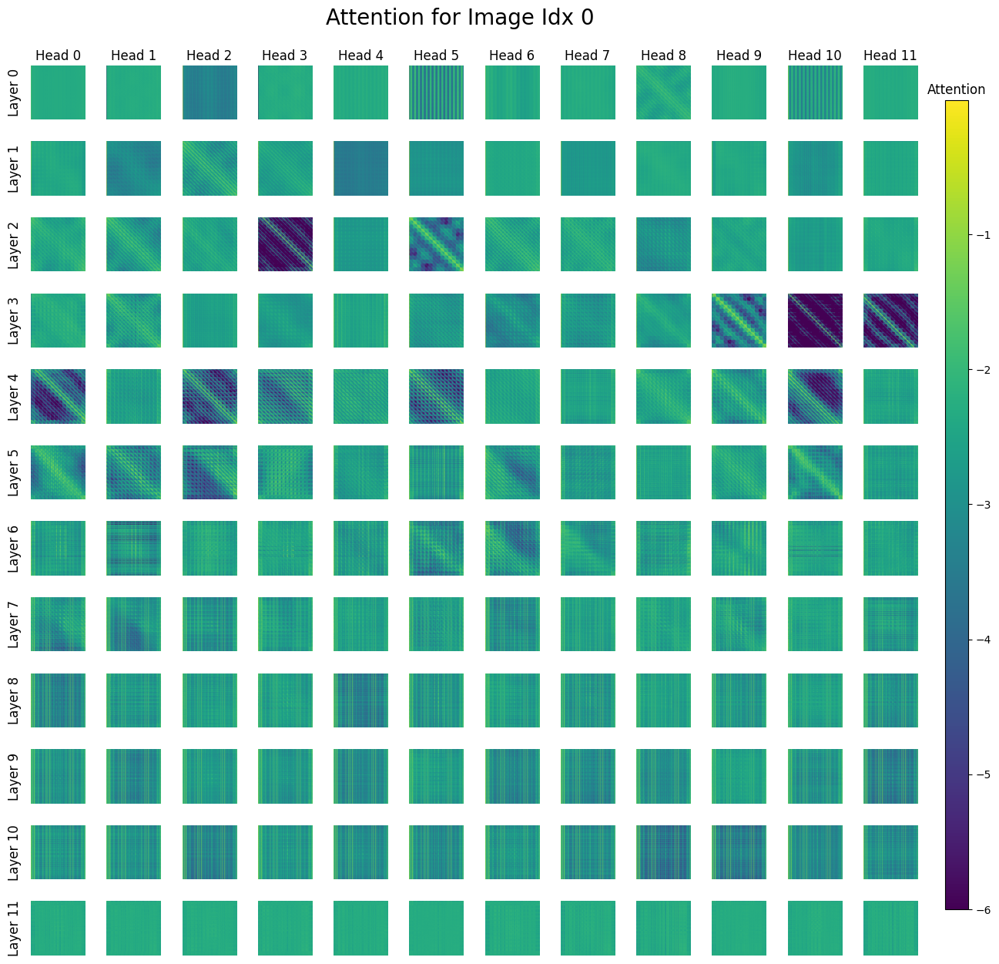

In [ ]:
# Attention patterns across layers 
from vit_prisma.visualization.visualize_attention import plot_attn_heads
print(f"Shape of cache: {attn_patterns_from_shorthand.shape}")  # Should be [batch, heads, dest, src]
all_attentions = []

for layer_idx in range(clip_model.cfg.n_layers):
    for head_idx in range(clip_model.cfg.n_heads):
        attn = clip_image_cache["pattern",layer_idx][head_idx,:,:]  # Accessing the attention pattern for the specific layer and head. No need for batch index since there are no batches in the cache
        all_attentions.append(attn)
all_attentions = t.stack(all_attentions, dim=0) # Stacking attention patterns vertically
all_attentions = all_attentions.cpu().numpy()  # Move to CPU for visualization
print(f"Shape of all attentions: {all_attentions.shape}")  # [heads, dest, src]
plot_attn_heads(
    total_activations=all_attentions,
    n_heads=clip_model.cfg.n_heads,  # Number of attention heads
    n_layers=clip_model.cfg.n_layers,  # Number of layers
    global_min_max= True,  # Use global min-max scaling for all heads
    img_shape=all_attentions.shape[-1],  # Assuming square attention maps
    figsize=(15, 15),  # Set the figure size
    global_normalize=False,
    log_transform=True,
)

In [ ]:
from IPython.display import display, HTML
try:
    t.cuda.empty_cache()
except RuntimeError as e:
    print(f"Error {e}")
image_logits, image_cache = clip_model.run_with_cache(
    input = image_inputs["pixel_values"],
    return_cache_object=True,
    remove_batch_dim=False,
    names_filter=lambda name: 'hook_pattern' in name
)

In [ ]:
# Corner head: a special localised attention head that often focuses on the corners of the feature map or the input image
# Study corner head without CLS token
# Need to slice CLS token out from the attention patterns since its inclusion does not provide accurate positional visualisation
attn_head_idx_1 = 8
batch_idx_1 = 0
cfg = clip_model.cfg  # Use the actual model config, not HookedViTConfig()
print(f"Config Debug")
print(f"CLIP model config patch size: {cfg.patch_size}")
print(f"CLIP model config image size: {cfg.image_size}")
print(f" Expected patches per side: {cfg.image_size // cfg.patch_size}")
print(f"Expected total patches: {(cfg.image_size // cfg.patch_size) ** 2}")  
print(f"Expected total tokens (with CLS): {(cfg.image_size // cfg.patch_size) ** 2 + 1}")
# Get the full attention patterns [batch, heads, query_tokens, key_tokens]
full_patterns = visualise_attention(attn_head_idx_1, image_cache,cfg, "Attention Scores", 700,batch_idx=batch_idx_1,attention_type="hook_pattern")
print(f"Full patterns before squeezing: {full_patterns.shape}")
full_patterns = full_patterns[0].squeeze(0)
print(f"Full patterns shape: {full_patterns.shape}")

corner_patterns = full_patterns[1:,1:]
patterns_np: np.ndarray = corner_patterns.cpu().numpy()
image_np: np.ndarray = images[batch_idx_1].cpu().numpy()
print(f"Corner pattern shape after extraction: {patterns_np.shape}")
html_code = plot_javascript(
        [patterns_np],  # List containing the 2D attention matrix
        [image_np],
        cfg=cfg,  # Use the actual model config
        list_of_names=[f"Corner Head Without CLS Token: Attention Head {attn_head_idx_1}"],
        ATTN_SCALING= 2  # This should match 197x197 matrix
    )

output_path = "attention_visualisation.html"
try: 
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write(html_code)
    abs_path = os.path.abspath(output_path)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Config Debug
CLIP model config patch size: 16
CLIP model config image size: 224
 Expected patches per side: 14
Expected total patches: 196
Expected total tokens (with CLS): 197
Full patterns before squeezing: torch.Size([1, 197, 197])
Full patterns shape: torch.Size([197, 197])
Corner pattern shape after extraction: (196, 196)
Shape of attention head: 2
Image shape before prepare_image:(3, 224, 224)
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.0169732  0.01441157 0.01033923 0.00832335 0.00740259 0.01023218
 0.01236732 0.01015781 0.00685719 0.0056116 ]
First 10 values of the first image data: [0.7019608  0.7019608  0.70980394 0.7137255  0.72156864 0.7254902
 0.7254902  0.73333335 0.73333335 0.7411765 ]
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic_tool_with_mechinterp\attent

In [ ]:
# Study corner head across all data points (pre-softmax)
cfg = clip_model.cfg
attn_head_idx = 8
list_of_attn_heads = attn_head_idx
pre_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, batch_idx = batch_idx_1, attn_type="attn_scores")
print(f"Pre all patterns shape before squeezing: {pre_all_patterns.shape}")
pre_all_patterns = pre_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{pre_all_patterns.shape}")
print(f"First 5 rows of pre_all_patterns:\n {pre_all_patterns[:5,:5]}")
list_of_images = images[0]

print(f"Length of list of images: {len(list_of_images)}")
html_code_all = plot_javascript(
    [pre_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"Corner head across all data points (pre-softmax): Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_all = "attention_visualisation_all.html"
try: 
    with open(output_path_all, 'w', encoding='utf-8') as f:
        f.write(html_code_all)
    abs_path = os.path.abspath(output_path_all)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Pre all patterns shape before squeezing: torch.Size([8, 197, 197])
All patterns shape:(196, 196)
First 5 rows of pre_all_patterns:
 [[3.2783606 3.1147563 2.7826707 2.5657897 2.4485555]
 [3.2110956 3.302498  3.0965014 2.7856514 2.4510055]
 [2.897379  3.119165  3.14036   2.9788163 2.6505942]
 [2.6355715 2.769183  2.9442515 3.056423  2.944937 ]
 [2.4466722 2.3566236 2.5438802 2.8851466 3.0720916]]
Length of list of images: 3
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[3.2783606 3.1147563 2.7826707 2.5657897 2.4485555 2.7722633 2.961783
 2.7649677 2.3720229 2.1715603]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users

In [ ]:
# Study attention patterns of corner head across all data points (post-softmax)
cfg = clip_model.cfg
attn_head_idx = 8
list_of_attn_heads = attn_head_idx
post_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, attn_type="pattern")
print(f"Post all patterns shape before squeezing: {post_all_patterns.shape}")
post_all_patterns = post_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{post_all_patterns.shape}")
print(f"First 5 rows of post_all_patterns:\n {post_all_patterns[:5,:5]}")
list_of_images = images[0]

print(f"Length of list of images: {len(list_of_images)}")
html_code_all = plot_javascript(
    [post_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Corner head (post-softmax): Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_all = "attention_visualisation_all.html"
try: 
    with open(output_path_all, 'w', encoding='utf-8') as f:
        f.write(html_code_all)
    abs_path = os.path.abspath(output_path_all)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Post all patterns shape before squeezing: torch.Size([8, 197, 197])
All patterns shape:(196, 196)
First 5 rows of post_all_patterns:
 [[0.0169732  0.01441157 0.01033923 0.00832335 0.00740259]
 [0.01558753 0.01707941 0.01389984 0.01018613 0.00728911]
 [0.01221116 0.01524325 0.01556978 0.01324722 0.00954069]
 [0.00996356 0.01138784 0.01356665 0.01517707 0.01357595]
 [0.00856374 0.00782629 0.00943801 0.01327671 0.01600588]]
Length of list of images: 3
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.0169732  0.01441157 0.01033923 0.00832335 0.00740259 0.01023218
 0.01236732 0.01015781 0.00685719 0.0056116 ]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTML

In [ ]:
# Study Modulus head across all data points without CLS token (pre-softmax)
attn_head_idx = 69 # The index of the "pure" Modulus head is calculated as (layer_index * n_heads) + head_index = (5 * 12) + 9 = 69
modulus_pre_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, attn_type="attn_scores")
print(f"Modulus all patterns before squeezing: {modulus_pre_all_patterns.shape}")
modulus_pre_all_patterns = modulus_pre_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{modulus_pre_all_patterns.shape}")
print(f"First 5 rows of modulus_all_patterns_pre:\n {modulus_pre_all_patterns[:5,:5]}")
list_of_images = images[0]
html_code_modulus_pre = plot_javascript(
    [modulus_pre_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Modulus head Pre-softmax: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_modulus_pre = "attention_visualisation_modulus_pre.html"
try:
    with open(output_path_modulus_pre, 'w', encoding='utf-8') as f:
        f.write(html_code_modulus_pre)
    abs_path = os.path.abspath(output_path_modulus_pre)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Modulus all patterns before squeezing: torch.Size([8, 197, 197])
All patterns shape:(196, 196)
First 5 rows of modulus_all_patterns_pre:
 [[ 2.7782888   1.1219809   0.8978705   1.0017962   0.9597063 ]
 [ 0.34415874  1.5192221  -0.43235123 -1.5454817  -1.3476226 ]
 [ 0.82854414  1.5091355   0.36602336 -0.25675267 -0.099666  ]
 [ 1.7543294   1.280018    1.1948702   1.3801005   1.4651669 ]
 [ 1.1241068   1.1472701   0.85561776  0.89837116  1.0634443 ]]
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[2.7782888  1.1219809  0.8978705  1.0017962  0.9597063  0.74649066
 0.6031394  0.744563   0.5753467  0.40478015]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTM

In [ ]:
# Study Modulus Head across all data points without CLS token (post-softmax)

attn_head_idx = 69 # The index of the "pure" Modulus head is calculated as (layer_index * n_heads) + head_index = (5 * 12) + 9 = 69
modulus_post_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, attn_type="pattern")
print(f"Modulus all patterns before squeezing: {modulus_post_all_patterns.shape}")
modulus_post_all_patterns = modulus_post_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{modulus_post_all_patterns.shape}")
print(f"First 5 rows of modulus_all_patterns_post:\n {modulus_post_all_patterns[:5,:5]}")
list_of_images = images[0]
html_code_modulus_post = plot_javascript(
    [modulus_post_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Modulus head Post-softmax: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_modulus_post = "attention_visualisation_modulus.html"
try:
    with open(output_path_modulus_post, 'w', encoding='utf-8') as f:
        f.write(html_code_modulus_post)
    abs_path = os.path.abspath(output_path_modulus_post)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

Modulus all patterns before squeezing: torch.Size([8, 197, 197])
All patterns shape:(196, 196)
First 5 rows of modulus_all_patterns_post:
 [[0.08609971 0.01643146 0.01313247 0.01457071 0.01397016]
 [0.03250194 0.10525259 0.01495117 0.00491189 0.00598657]
 [0.03148223 0.06217884 0.01982418 0.01063475 0.01244368]
 [0.02968523 0.01847352 0.01696565 0.02041808 0.02223099]
 [0.02236878 0.02289297 0.01710169 0.0178487  0.02105217]]
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.08609971 0.01643146 0.01313247 0.01457071 0.01397016 0.01128764
 0.00978017 0.0112659  0.00951209 0.00802047]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁

In [ ]:
# Study Edge head without CLS token (pre-softmax)
attn_head_idx = 10
edge_pre_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, attn_type="attn_scores")
edge_pre_all_patterns = edge_pre_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{edge_pre_all_patterns.shape}")
print(f"First 5 rows of edge_all_patterns_pre:\n {edge_pre_all_patterns[:5,:5]}")
list_of_images = images[0]
html_code_edge_pre = plot_javascript(
    [edge_pre_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Edge head Pre-softmax: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_edge_pre = "attention_visualisation_edge_pre.html"
try:
    with open(output_path_edge_pre, 'w', encoding='utf-8') as f:
        f.write(html_code_edge_pre)
    abs_path = os.path.abspath(output_path_edge_pre)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

All patterns shape:(196, 196)
First 5 rows of edge_all_patterns_pre:
 [[2.6472294  3.5280707  3.2746243  2.1674445  0.77972   ]
 [2.615308   3.4941943  3.2425828  2.1394293  0.7568445 ]
 [2.6195424  3.4961615  3.245751   2.1461346  0.767984  ]
 [2.6671705  3.5480614  3.2963014  2.1911044  0.80613047]
 [2.7011926  3.5947526  3.3396194  2.2182455  0.8153512 ]]
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[2.6472294  3.5280707  3.2746243  2.1674445  0.77972    0.4340552
 0.5283428  0.67192376 0.74135953 0.81967276]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnostic

In [ ]:
# Study Edge head without CLS token (post-softmax)
attn_head_idx = 10
edge_post_all_patterns = get_attn_across_datapoints(attn_head_idx=attn_head_idx, attn_type="hook_pattern")
edge_post_all_patterns = edge_post_all_patterns[0].squeeze(0)[1:,1:].cpu().numpy()
print(f"All patterns shape:{edge_post_all_patterns.shape}")
print(f"First 5 rows of edge_all_patterns_pre:\n {edge_post_all_patterns[:5,:5]}")
list_of_images = images[0]
html_code_edge_post = plot_javascript(
    [edge_post_all_patterns],
    list_of_images=list_of_images,
    cfg=cfg,
    list_of_names=[f"All Patterns Edge head Pre-softmax: Attention Head {attn_head_idx}"],
    ATTN_SCALING=8)
output_path_edge_post = "attention_visualisation_edge_pre.html"
try:
    with open(output_path_edge_post, 'w', encoding='utf-8') as f:
        f.write(html_code_edge_post)
    abs_path = os.path.abspath(output_path_edge_post)
    print(f"\n✅ HTML Visualisation Saved.")
    print(f"📁 File: {abs_path}")
    print(f"\nTo view:")
    print(f"1. Find the file in your directory.")
    print(f"2. Double-click to open in your web browser.")
    print(f"3. Or copy this path and paste to your browser address bar: file://{abs_path}")
except Exception as e:
    print(f"❌ Error saving HTML file: {e}")

All patterns shape:(196, 196)
First 5 rows of edge_all_patterns_pre:
 [[0.00455265 0.01098522 0.00852587 0.00281771 0.00070342]
 [0.00448613 0.01080357 0.00840028 0.00278741 0.00069944]
 [0.0045094  0.01083501 0.00843485 0.0028088  0.00070794]
 [0.00459819 0.01109566 0.00862611 0.0028565  0.00071507]
 [0.00465016 0.01136412 0.00880507 0.00286897 0.00070543]]
Shape of attention head: 2
Image shape before prepare_image:torch.Size([3, 224, 224])
Image shape after prepare_image:(224, 224, 3)
Expected image shape: (224,224,3)
--- DEBUGGING DATA ---
Number of attention heads: 1
First 10 values of the first attention head:[0.00455265 0.01098522 0.00852587 0.00281771 0.00070342 0.00049785
 0.00054707 0.00063154 0.00067695 0.00073209]
First 10 values of the first image data: tensor([0.7020, 0.7020, 0.7098, 0.7137, 0.7216, 0.7255, 0.7255, 0.7333, 0.7333,
        0.7412])
--- END DEBUGGING DATA ---

✅ HTML Visualisation Saved.
📁 File: c:\Users\User\Documents\Cross_modal_interpretability\diagnosti